In [44]:
import torch
import numpy as np
import scipy.linalg
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt
from verification import LinearQuadraticRegulator, NeuralNet, GenerateSpaceData
from tqdm import tqdm
from verification import _hjbEquation

# Dimension > 2

In [41]:
interiorPointCount = 10000
dataPointCount = 1000
iterations = [1000, 2000, 3000, 3000]
lrs = [1e-1, 1e-2, 5e-3, 1e-3]
weight_decays = [0, 0, 0, 0]
#layers = [2, 1]
layers = [10, 50, 50, 50, 1]
# [residual, data, gradient]
gamma = np.array([0.1, 1., 1.])
#gamma = np.array([1, 0., 0.])

In [42]:
network = NeuralNet(layers=layers, lrs=lrs, weight_decays=weight_decays, special=False, addData=False)
lqr = LinearQuadraticRegulator(network=network, gamma=gamma, dim=layers[0])

In [13]:
info = lqr.train(interiorPointCount, dataPointCount, iterations)

torch.Size([1000, 10])


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

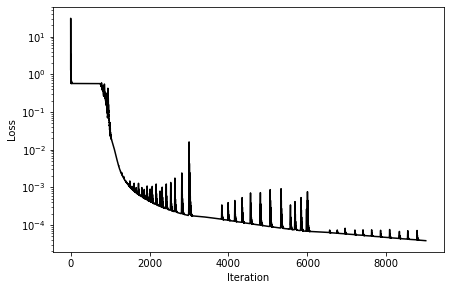

In [159]:
fig, ax = plt.subplots(figsize=(7, 4.5))
ax.plot( info['it'], info['loss'], color='black' )
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.set_yscale('log');

In [4]:
import numpy as np

a = np.linspace(0, 1, 1000)

In [6]:
a.reshape(*[10 for i in range(3)] )

array([[[0.        , 0.001001  , 0.002002  , 0.003003  , 0.004004  ,
         0.00500501, 0.00600601, 0.00700701, 0.00800801, 0.00900901],
        [0.01001001, 0.01101101, 0.01201201, 0.01301301, 0.01401401,
         0.01501502, 0.01601602, 0.01701702, 0.01801802, 0.01901902],
        [0.02002002, 0.02102102, 0.02202202, 0.02302302, 0.02402402,
         0.02502503, 0.02602603, 0.02702703, 0.02802803, 0.02902903],
        [0.03003003, 0.03103103, 0.03203203, 0.03303303, 0.03403403,
         0.03503504, 0.03603604, 0.03703704, 0.03803804, 0.03903904],
        [0.04004004, 0.04104104, 0.04204204, 0.04304304, 0.04404404,
         0.04504505, 0.04604605, 0.04704705, 0.04804805, 0.04904905],
        [0.05005005, 0.05105105, 0.05205205, 0.05305305, 0.05405405,
         0.05505506, 0.05605606, 0.05705706, 0.05805806, 0.05905906],
        [0.06006006, 0.06106106, 0.06206206, 0.06306306, 0.06406406,
         0.06506507, 0.06606607, 0.06706707, 0.06806807, 0.06906907],
        [0.07007007, 0.0710

In [160]:
dim = 10
a = np.meshgrid( *[np.array([ -0.9, -0.5, 0., 0.5, 0.9]) for i in range(dim)] )
space = torch.tensor( list(a) ).T.float().reshape(-1, dim)

In [161]:
# solution fron the NN
Z = lqr.network.model( space ).detach().numpy()

In [162]:
P = 0.69 * np.diag(np.ones(shape=(10)))

def valueFunction(x):
    yValueFunction = 0.5 * np.dot(x.T, np.dot(P, x)).item()
    return yValueFunction

In [163]:
Ztrue = np.array( [ valueFunction(x.reshape(-1, 1)) for x in space.numpy() ] ).reshape(-1, 1)

In [164]:
( (Z - Ztrue)**2 ).mean()

5.969322361975125e-06

In [165]:
valueFunction(space[0])

2.794499851942064

In [166]:
lqr.network.model( space[0] ).detach().numpy()

array([2.7890396], dtype=float32)

In [2]:
def stackWeights(network):
    weights = np.array([])
    for layer in network.layers:
        if type(layer) == nn.Linear:
            weights = np.concatenate([
                weights,
                layer.weight.detach().numpy().flatten(),
                layer.bias.detach().numpy().flatten()
            ])
    return weights

In [3]:
interiorPointCount = 1000
dataPointCount = 20
iterations = [10]
lrs = [1e-1]
#layers = [2, 1]
layers = [2, 10, 1]
# [residual, data, gradient]
gamma = np.array([0.1, 1., 1.])
#gamma = np.array([1, 0., 0.])

In [4]:
network = NeuralNet(layers=layers, lrs=lrs, special=False)
lqr = LinearQuadraticRegulator(network=network, gamma=gamma, dim=2)

original_weights = stackWeights(lqr.network)

In [18]:
# load weights
lqr.network.load_state_dict(torch.load('weights.pt'))

<All keys matched successfully>

In [43]:
for i in lqr.network.parameters():
    print(i)

Parameter containing:
tensor([[-0.4596, -0.4704],
        [-0.1023, -0.1771],
        [ 0.2445, -0.6349],
        [-0.1394,  0.7565],
        [ 0.1911, -0.0644],
        [ 0.5894,  0.1086],
        [ 0.5672,  0.6476],
        [ 0.3863, -0.3444],
        [ 0.3804,  0.5140],
        [ 0.8185,  0.0219]], requires_grad=True)
Parameter containing:
tensor([-0.6924, -0.3082,  0.5288, -0.4916, -0.3340,  0.0182, -0.6773,  0.3226,
         0.4474, -0.5830], requires_grad=True)
Parameter containing:
tensor([[ 0.6571, -0.1251, -0.9290,  0.2424, -0.4624, -0.5964,  0.1720,  0.3573,
         -0.3067, -0.1720]], requires_grad=True)
Parameter containing:
tensor([-0.1722], requires_grad=True)


Text(0.5, 0, 'z')

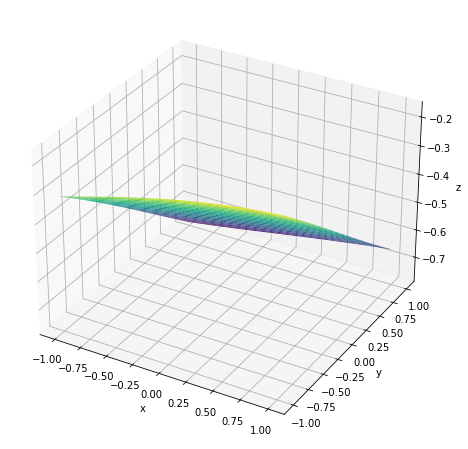

In [7]:
nPoint = 20
x = np.linspace(-1, 1, nPoint)
y = np.linspace(-1, 1, nPoint)

X, Y = np.meshgrid(x, y)
space = torch.tensor([X, Y]).T.float()

# solution fron the NN
Z = lqr.network.model(space.reshape(-1, 2)).reshape(nPoint,nPoint).detach().numpy()

fig = plt.figure(figsize=(8, 8))
ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
#ax.set_zlim(-1,0);

In [8]:
xInt = torch.tensor(feedDict['xInt'], requires_grad=True).float()
xData = torch.tensor(feedDict['xData'], requires_grad=True).float()
yInt = lqr.network.model(xInt)
yData = lqr.network.model(xData)
gradData = lqr.network.partialDerivative(inputTensor=xData, x=xData, order=1)

loss = lqr.computeLossTerms(yInt, xInt, yData, gradData, xData)

NameError: name 'feedDict' is not defined

In [46]:
loss

tensor(0.0975, dtype=torch.float64, grad_fn=<AddBackward0>)

In [47]:
derivativeSpace = lqr.network.partialDerivative(inputTensor=xInt, x=xInt, order=1)

In [48]:
from verification import _hjbEquation
from utils import vect

equation = _hjbEquation(
    xInt=xInt,
    yInt=yInt,
    derivativeSpace=derivativeSpace,
    gx=vect(xInt, lqr.g),
    fx=lqr.f(xInt),
    lx=lqr.l(xInt),
    beta=lqr.beta
)

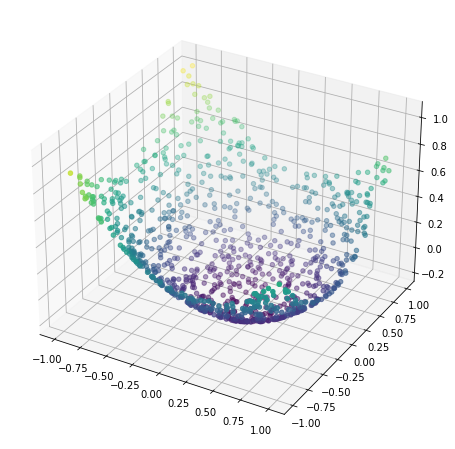

In [49]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

my_cmap = plt.get_cmap('viridis')

ax.scatter3D(xInt[:,0].detach().numpy(), xInt[:,1].detach().numpy(), equation.detach().numpy(), c = equation.detach().numpy(), cmap = my_cmap);

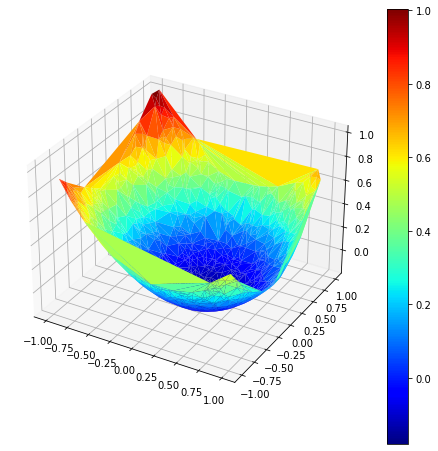

In [50]:
from matplotlib import cm

fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_trisurf(xInt[:,0].detach().numpy().flatten(), xInt[:,1].detach().numpy().flatten(), equation.detach().numpy().flatten(), cmap=cm.jet, linewidth=0)
fig.colorbar(surf);

In [70]:
xInt[:,0].detach().numpy().flatten().shape

(1000,)

In [18]:
df = pd.DataFrame()
df['equation'] = equation.detach().numpy().flatten()
df['derivativeSpace'] = [derivative for derivative in derivativeSpace.detach().numpy()]
df['xInt'] = [x for x in xInt.detach().numpy()]
df['yInt'] = [y for y in yInt.detach().numpy()]

In [19]:
idx = list( df[df['equation'] > 0.5].index )

In [9]:
loss = _hjbEquation(
    xInt=xInt[idx],
    yInt=yInt[idx],
    derivativeSpace=derivativeSpace[idx],
    gx=vect(xInt[idx], lqr.g),
    fx=lqr.f(xInt[idx]),
    lx=lqr.l(xInt[idx]),
    beta=lqr.beta
)

NameError: name 'xInt' is not defined

In [80]:
loss

tensor([[0.6926],
        [0.5199],
        [0.5863],
        [0.6140],
        [0.5414],
        [0.5072],
        [0.5802],
        [0.5585],
        [0.5185],
        [0.5408],
        [0.7585]], grad_fn=<AddBackward0>)

In [ ]:
lqr.computeLossTerms(yInt, xInt, yData, gradData, xData)

In [5]:
# what about sampling more often?

plt.scatter(feedDict['xInt'][:,0], feedDict['xInt'][:,1]);

KeyError: 'xInt'

In [5]:
info = lqr.train(interiorPointCount, dataPointCount, iterations)

0 / 10 (0 / 10), lr:1.0e-01, loss:7.62e-01


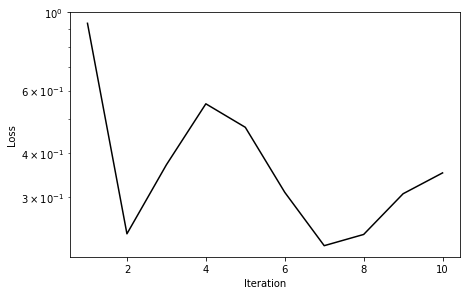

In [6]:
fig, ax = plt.subplots(figsize=(7, 4.5))
ax.plot( info['it'], info['loss'], color='black' )
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.set_yscale('log');

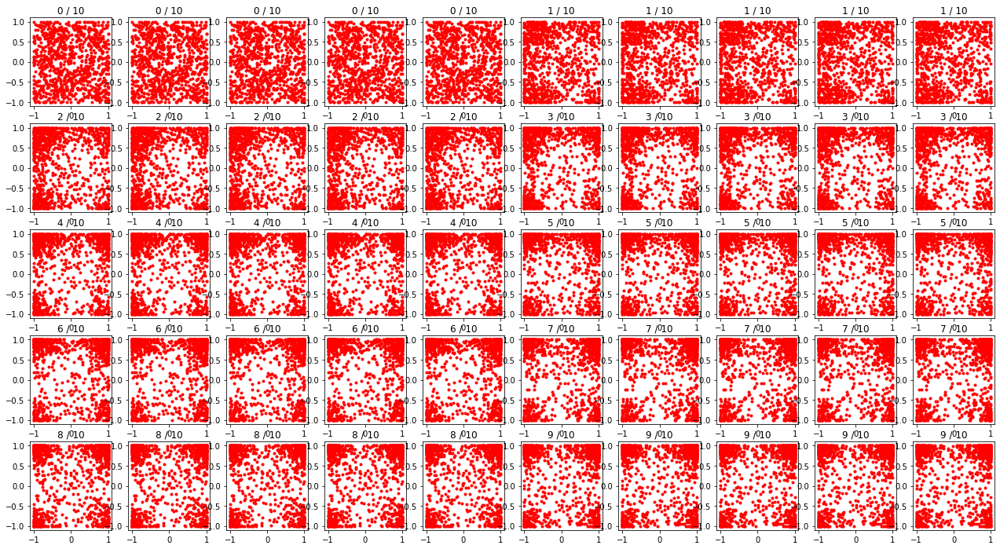

In [7]:
idx_total = sum( iterations )
fig, axs = plt.subplots(5, 10, figsize=(22,12))
axs = axs.flatten()
for ax, ratio in zip(axs[:-1], np.linspace(0, 1, len(axs))[:-1]):
    idx = int(ratio * idx_total)
    ax.scatter( info['xInt'][idx][:,0], info['xInt'][idx][:,1], color='red' , marker='.')
    ax.set_title('%d / %d'%(idx, idx_total))
idx = idx_total - 1
axs[-1].scatter( info['xInt'][idx][:,0], info['xInt'][idx][:,1], color='red' , marker='.')
axs[-1].set_title('%d / %d'%(idx, idx_total));

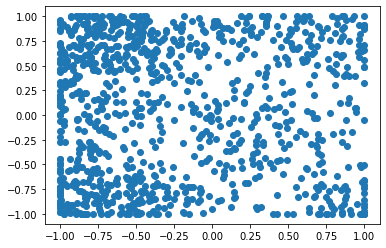

In [17]:
plt.scatter( info['xInt'][1][:,0], info['xInt'][1][:,1] )

In [25]:
np.savetxt("sampling.csv", np.vstack([
    info['xInt'][0][:,0].flatten()[::2],
    info['xInt'][0][:,1].flatten()[::2],
    info['xInt'][1][:,0].flatten()[::2],
    info['xInt'][1][:,1].flatten()[::2],
    info['residual'][0].flatten()[::2]
    ]).T, delimiter=",", fmt="%.6f")

In [9]:
nPoint = 20
x = np.linspace(-1, 1, nPoint)
y = np.linspace(-1, 1, nPoint)

X, Y = np.meshgrid(x, y)
space = torch.tensor([X, Y]).T.float()

# solution fron the NN
Z = lqr.network.model(space.reshape(-1, 2)).reshape(nPoint,nPoint).detach().numpy()


# P solution of LQR
P = np.matrix(scipy.linalg.solve_continuous_are(
    np.eye(2), 
    np.eye(2),
    np.eye(2), 
    0.2*np.eye(2)
    ))

# hard coded value for P
#P = np.array([[-0.289897, 0],[0, -0.289897]])
P = np.array([[0.68989, 0], [0, 0.68989]])
#P = np.array([[-0.1393,0], [0, 0.3479]]) / 0.5

def valueFunction(x):
    return 0.5 * np.dot(x.T, np.dot(P, x)).item()

# true solution
Ztrue = np.array([valueFunction(x.reshape(-1, 1)) for x in space.numpy().reshape(-1, 2)]).reshape(nPoint, nPoint)

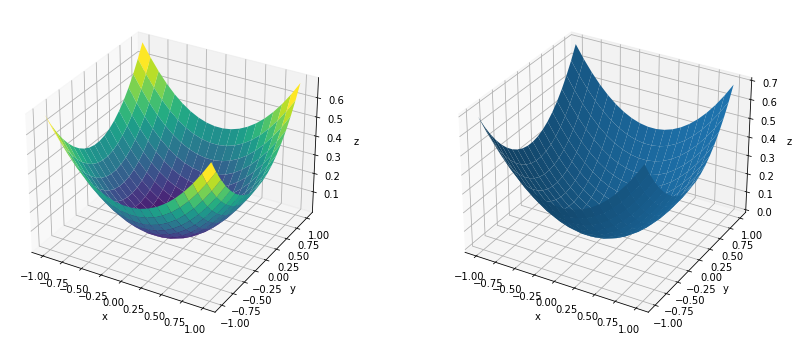

In [10]:
fig = plt.figure(figsize=(22, 6))
#ax = fig.add_subplot(1, 3, 1)
#for i in range(dataPointCount):
#    xi, yi = lqr.network.xData[i].detach()
#    zi = valueFunction(lqr.network.xData[i].detach())
#    ax.scatter(xi, yi, marker='o',color='red', zorder=10)
#ax.contourf(X, Y, Z)
#ax.set_xlabel('x')
#ax.set_ylabel('y');

ax = fig.add_subplot(1, 3, 2, projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
#ax.set_zlim(0,0.7)

ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.plot_surface(X, Y, Ztrue)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0,0.7);

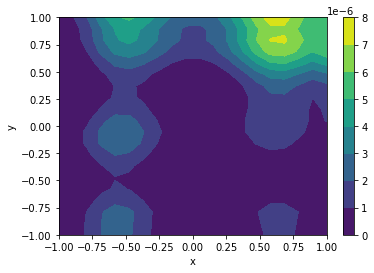

Error (vs true): 0.001


In [11]:
plt.contourf(X, Y, (Z-Ztrue)**2)
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar()
plt.show()
print('Error (vs true): %.3f' %((Z-Ztrue)**2).sum() )

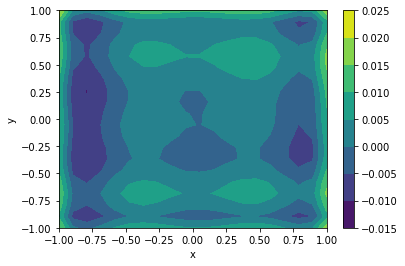

Error (res): 0.780


In [13]:
xSpace = space.reshape(-1, 2)
xSpace.requires_grad = True

lossResidual = _hjbEquation(
    xInt=xSpace,
    yInt=lqr.network.model(xSpace),
    derivativeSpace=lqr.network.partialDerivative(inputTensor=xSpace, x=xSpace, order=1),
    gx=vect(xSpace, lqr.g),
    fx=lqr.f(xSpace),
    lx=lqr.l(xSpace),
    beta=lqr.beta
)

plt.contourf(X, Y, lossResidual.detach().numpy().reshape(nPoint, nPoint))
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar()
plt.show()
print('Error (res): %.3f' %lossResidual.detach().numpy().sum() )

In [198]:
# save the weights
torch.save(lqr.network.state_dict(), 'weights.pt')

In [75]:
def valueFunction(P, x):
    return 0.5 * np.dot(x.T, np.dot(P, x)).item()

In [76]:
Yflat = Y.reshape(-1, 1)
Xflat = X.reshape(-1, 1)

P = np.array([[0.68989, 0], [0, 0.68989]])
Zposposflat = np.array([valueFunction(P, x.reshape(-1, 1)) for x in space.numpy().reshape(-1, 2)]).reshape(-1, 1)

P = np.array([[-0.289897, 0], [0, 0.68989]])
Znegposflat = np.array([valueFunction(P, x.reshape(-1, 1)) for x in space.numpy().reshape(-1, 2)]).reshape(-1, 1)

P = np.array([[0.68989, 0], [0, -0.289897]])
Zposnegflat = np.array([valueFunction(P, x.reshape(-1, 1)) for x in space.numpy().reshape(-1, 2)]).reshape(-1, 1)

P = np.array([[-0.289897, 0], [0, -0.289897]])
Znegnegflat = np.array([valueFunction(P, x.reshape(-1, 1)) for x in space.numpy().reshape(-1, 2)]).reshape(-1, 1)

np.savetxt("residual.csv", np.hstack([Xflat, Yflat, Zposposflat, Znegposflat, Zposnegflat, Znegnegflat]), delimiter=",", fmt="%.6f")

(400,)

## Analyse the weights

In [134]:
dataset_weights = stackWeights(lqr.network)
dataset_weights

array([-1.04517174,  1.99866319, -1.70935798, -0.302304  , -0.87935174,
       -1.29277515,  1.50018978,  1.54599881, -1.33090556,  0.2426977 ,
       -2.80411363,  0.97151148,  1.78100479,  0.90562707,  1.30489194,
       -1.43224442, -0.76152873, -0.82727087, -0.83736932, -1.49402976,
       -2.83332157, -2.28873062,  1.20736194, -3.52774072, -4.11046743,
       -1.94955707, -3.31563115, -2.39588356, -3.76794767, -2.63783169,
        0.87742746,  1.19848049, -0.63845432,  0.86684954, -0.03660468,
        0.08962264,  0.59586549,  1.42606664,  0.41479009,  1.16167295,
        0.07007346])

In [135]:
np.mean(np.square(dataset_weights - optimal_weights))

0.36320458643305453

In [131]:
optimal_weights = stackWeights(lqr.network)
optimal_weights

array([-0.15713713,  1.70629144, -1.53577697, -0.05661722, -0.53217566,
       -1.52024984,  0.74547899,  1.75173092, -0.24262869,  0.08184004,
       -1.67752469,  0.50542384,  1.91719377,  0.01435652,  0.70582402,
       -0.79985929, -0.59234226, -1.66859531, -0.1281576 , -1.58632147,
       -2.8259201 , -2.37342477,  1.37404835, -4.05247021, -6.00279856,
       -2.98136616, -2.83165479, -2.26307654, -4.53620148, -2.51552749,
        1.27552223,  1.93120909, -0.59594798,  1.00727606,  0.01213902,
        0.51736081,  1.2953186 ,  1.73436725,  0.89200491,  1.47648835,
        0.07007346])

In [90]:
np.mean(np.square(optimal_weights - original_weights))

1.8590956469386448

In [92]:
np.savetxt("weights.csv", np.hstack([
    original_weights.reshape(-1,1),
    optimal_weights.reshape(-1,1),
    optimal_weights_reverse.reshape(-1,1),
    ]), delimiter=",", fmt="%.6f")

In [39]:
weights = pd.read_csv('weights.csv', header=None, names=['original', 'optimal', 'optimal_reverse'])

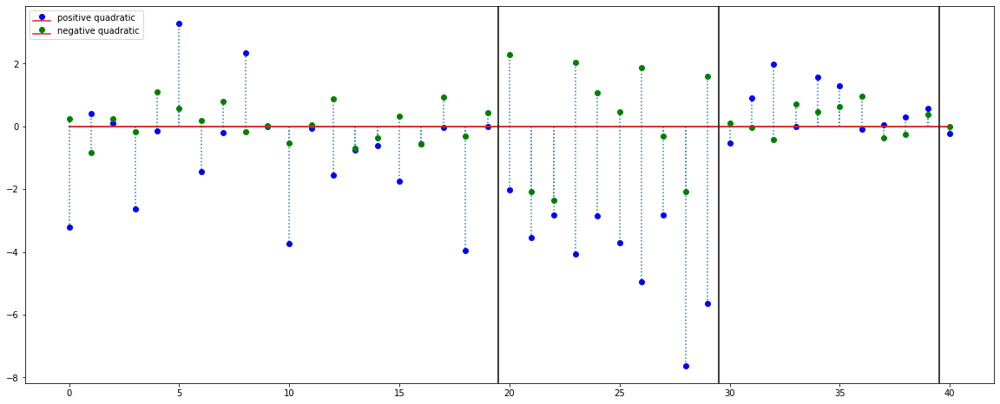

In [61]:
fig, ax = plt.subplots(figsize=(20, 8))
#ax.scatter(weights.index, weights['optimal'] - weights['original'])
ax.stem(weights.index, weights['optimal'] - weights['original'], 'b', linefmt=':', markerfmt='bo', label='positive quadratic')
ax.stem(weights.index, weights['optimal_reverse'] - weights['original'], 'g', linefmt=':', markerfmt='go', label='negative quadratic')
ax.axvline(x = 19.5, color='black')
ax.axvline(x = 29.5, color='black')
ax.axvline(x = 39.5, color='black')
ax.legend()

In [34]:
weights.shape[0]

41

## Analyse the loss function
With only 2 parameters, we can show the loss function on a plot. And we know in this case, we have 4 global minima.

In this case, their is only the residual from the equation. So the HJB is equivalent to the Ricatti eq. The idea is to make a function of theses 2 parameters, en plot in in 3d, or contourf.

In [7]:
def lossFunction(x, y,  beta):
    def riccatiEquation(z):
        return z**2 - 4 * beta * z - 2 * beta
    return np.diag([riccatiEquation(x), riccatiEquation(y)])

def scalarisedLossFunction(x, y, beta=0.1):
    return np.linalg.norm( lossFunction(x, y, beta) )

In [8]:
scalarisedLossFunction(-0.28989794855664, 0.68989794855664, 0.1)

6.044855965932534e-15

In [9]:
x = np.linspace(-0.6, 1, 100)
y = np.linspace(-0.6, 1, 100)

X, Y = np.meshgrid(x, y)
vectorisedScalarisedLossFunction = np.vectorize(scalarisedLossFunction)
Zresidual = vectorisedScalarisedLossFunction(X, Y)

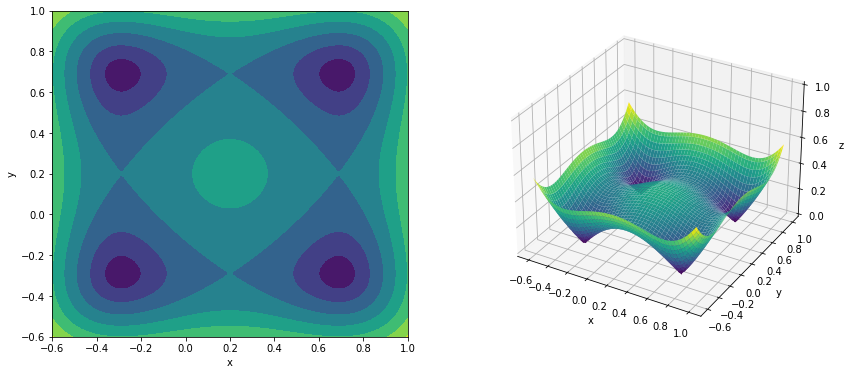

In [10]:
fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(1, 2, 1)
ax.contourf(X, Y, Zresidual)
ax.set_xlabel('x')
ax.set_ylabel('y');

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(X, Y, Zresidual, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0,1);

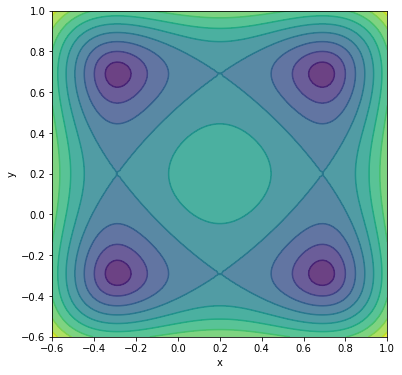

In [43]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.contour(X, Y, Zresidual, 10)
ax.contourf(X, Y, Zresidual, 10, alpha=0.8)
ax.set_xlabel('x')
ax.set_ylabel('y')
extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
plt.savefig('residual_only.pdf', bbox_inches=extent)

In [90]:
scalarisedLossFunction(-0.28989794855664, 0.68989794855664)

6.044855965932534e-15

In [91]:
# do an experiment where we see indeed the 4 different square in the place. attraction area for each global minimum.
def lossFunction(x,  beta):
    def riccatiEquation(z):
        return z**2 - 4 * beta * z - 2 * beta
    return torch.diag( riccatiEquation(x) )

def scalarisedLossFunction(x, beta=0.1):
    return torch.norm( lossFunction(x, beta) )


def testFunction(x):
    return 2 * torch.norm(x)

In [92]:
x0 = torch.tensor([-0.3, -0.3], requires_grad=True)
lr = 0.01
iterations = 200

def findSolution(x):
    for it in range(iterations):
        loss = scalarisedLossFunction(x)
        loss.backward()

        with torch.no_grad():
            x -= lr * x.grad

        x.grad.zero_()

    return x.detach().numpy()

In [93]:
findSolution(x0)

array([-0.29009822, -0.29009822], dtype=float32)

In [9]:
resu = []
nbDot = 100
for x in tqdm( np.linspace(-0.6, 1., nbDot) ):
    for y in np.linspace(-0.6, 1., nbDot):
        xInput = torch.tensor([x, y], requires_grad=True)
        info_dict = {'x':x, 'y':y, 'solution': findSolution(xInput)}
        resu.append(info_dict)
resu = pd.DataFrame(resu)

100%|██████████| 100/100 [05:17<00:00,  3.17s/it]


In [10]:
sol1 = []
sol2 = []
sol3 = []
sol4 = []
for _, row in resu.iterrows():
    sol1.append( np.allclose(np.array([-0.29, -0.29]), row['solution'], rtol=0.05, atol=0.05,) )
    sol2.append( np.allclose(np.array([-0.29, 0.69]), row['solution'], rtol=0.05, atol=0.05,) )
    sol3.append( np.allclose(np.array([0.69, -0.29]), row['solution'], rtol=0.05, atol=0.05,) )
    sol4.append( np.allclose(np.array([0.69, 0.69]), row['solution'], rtol=0.05, atol=0.05,) )

resu['sol1'] = sol1
resu['sol2'] = sol2
resu['sol3'] = sol3
resu['sol4'] = sol4

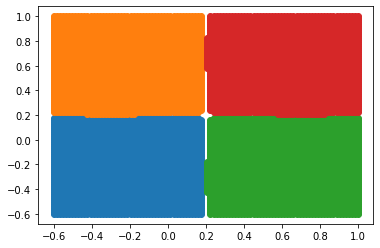

In [11]:
plt.scatter(resu[resu['sol1']]['x'], resu[resu['sol1']]['y'])
plt.scatter(resu[resu['sol2']]['x'], resu[resu['sol2']]['y'])
plt.scatter(resu[resu['sol3']]['x'], resu[resu['sol3']]['y'])
plt.scatter(resu[resu['sol4']]['x'], resu[resu['sol4']]['y']);

## Add the data term

In [54]:
# what is we add the data driven term?
# we need to define the function that simulates the neural network
# we can define our dataset to be some sample in [-1, 1]x[-1, 1]

In [12]:
dataSample = GenerateSpaceData(domain=([-1, 1], [-1, 1]))

In [13]:
xData = np.squeeze( np.array( dataSample.sampleDataX(20) ) ).T

In [14]:
np.einsum('ni, ij, ni -> n', xData, np.diag([0.2, 0.1]), xData)

array([0.09353641, 0.07284351, 0.00904178, 0.03309025, 0.06294864,
       0.02485923, 0.05399504, 0.20188105, 0.17217746, 0.01378174,
       0.09025642, 0.03074958, 0.00447317, 0.14677928, 0.23983335,
       0.14190502, 0.18917849, 0.09397819, 0.14066189, 0.12275064])

In [15]:
np.dot( xData[0], np.dot( np.diag([0.2, 0.1]), xData[0] ))

0.09353641354118605

In [16]:
def neuralNet(value1, value2, x):
    if len(x.shape) == 1:
        return 0.5 * np.einsum('i, ij, i -> ', x, np.diag([value1, value2]), x)
    else:
        return 0.5 * np.einsum('ni, ij, ni -> n', x, np.diag([value1, value2]), x)

In [17]:
def trueFunction(x):
    return neuralNet(0.68989794855664, 0.68989794855664, x)

In [18]:
trueFunction(xData)

array([0.31936518, 0.18737947, 0.01661847, 0.11136487, 0.20909841,
       0.05638258, 0.18088053, 0.48460713, 0.29729152, 0.02879422,
       0.19391315, 0.10491835, 0.0090416 , 0.25638775, 0.57340636,
       0.25429683, 0.33495351, 0.17152177, 0.3784553 , 0.23452061])

In [19]:
def dataLossFunction(value1, value2, xData):
    yTrue = trueFunction(xData)
    yData = neuralNet(value1, value2, xData)
    lossData = np.mean(np.square(yData - yTrue))

    return lossData

In [20]:
x = np.linspace(-0.6, 1, 100)
y = np.linspace(-0.6, 1, 100)

X, Y = np.meshgrid(x, y)

In [21]:
space = np.array([X, Y]).T

In [22]:
# we can choose to take the whole datset or only individual point
# depending on the spatial position of the point, it can be inpacted by one direction or the other. eg (0, 0.8) will only be impacted in one direction, and in that case will only impact one direction of the loss function.
# so we need to find the datapoint that would modyfy the most the weights ?

Zdata = 0
for dataPoint in xData:
    Zdata += 1/20. * np.array([dataLossFunction(x[0], x[1], dataPoint) for x in space.reshape(-1, 2)]).reshape(100, 100)

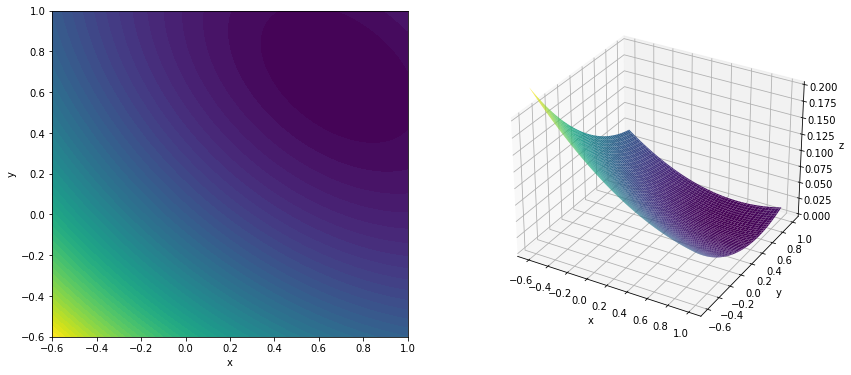

In [23]:
fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(1, 2, 1)
ax.contourf(X, Y, Zdata, 50)
ax.set_xlabel('x')
ax.set_ylabel('y');

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(X, Y, Zdata, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0, 0.2);

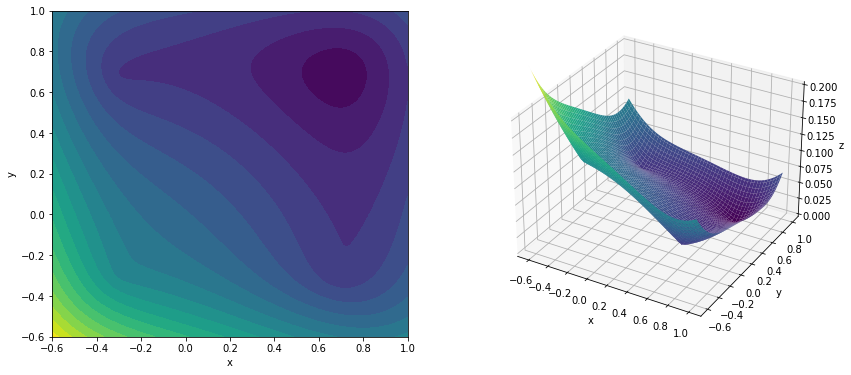

In [24]:
# mixing both
lamb = 0.1
totalLoss = lamb*Zresidual + (1-lamb)*Zdata

fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(1, 2, 1)
ax.contourf(X, Y, totalLoss, 20)
ax.set_xlabel('x')
ax.set_ylabel('y');

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(X, Y, totalLoss, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0, 0.2);

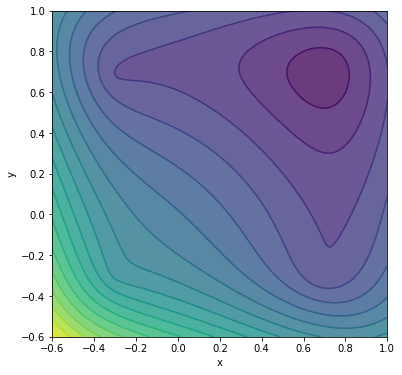

In [40]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.contour(X, Y, totalLoss, 20)
ax.contourf(X, Y, totalLoss, 20, alpha=0.8)
ax.set_xlabel('x')
ax.set_ylabel('y');
extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
plt.savefig('residual_data.pdf', bbox_inches=extent)

## Save data

In [53]:
Yflat = Y.reshape(-1, 1)
Xflat = X.reshape(-1, 1)

In [55]:
Zresidualflat = Zresidual.reshape(-1, 1)

In [70]:
Zdataflat = Zdata.reshape(-1, 1)

In [74]:
ZtotalLossflat = totalLoss.reshape(-1, 1)

In [71]:
np.savetxt("residual.csv", np.hstack([Xflat, Yflat, Zresidualflat, Zdataflat, ZtotalLossflat]), delimiter=",", fmt="%.6f")

In [23]:
data_x = []
data_y = []
data_z = []

In [24]:
for i in range(dataPointCount):
    xi, yi = lqr.network.xData[i]
    zi = valueFunction(lqr.network.xData[i])
    data_x.append(xi.item())
    data_y.append(yi.item())
    data_z.append(zi)

In [28]:
np.savetxt("dataset.csv", np.hstack([np.array(data_x).reshape(-1, 1), np.array(data_y).reshape(-1, 1), np.array(data_z).reshape(-1, 1)]), delimiter=",", fmt="%.6f")

## Sampling techniques
0. sample once at first
1. sample uniformly at every step
2. sample uniformly first and then put the residual as a coefficient of loss function
3. sample uniformly first and resample at every step: deleting the particle and replicate particles with high residual
4. sample uniformly first and create gaussian arround current particles and sample the number we need.

importance sampling for the residual training
we can assign the residual error as a weight on the probability

In [14]:
from verification import GenerateData
from numpy.random import choice

In [33]:
genData = GenerateData( ([0, 1], [0, 1]) )
exampleData = np.array( genData._sampleInteriorX(10) )[:,:,0].T

In [36]:
# sampling number 3
w = np.random.rand(10)
w = w / w.sum()

draw = choice(a=10, size=10, p=w)
exampleData[draw]

array([[0.01477804, 0.34256587],
       [0.3533646 , 0.04359805],
       [0.51459879, 0.33321431],
       [0.17888877, 0.91355411],
       [0.51459879, 0.33321431],
       [0.01477804, 0.34256587],
       [0.3533646 , 0.04359805],
       [0.72613168, 0.6432761 ],
       [0.51459879, 0.33321431],
       [0.17888877, 0.91355411]])

In [15]:
dataSampler = GenerateSpaceData(domain=[(-1, 1), (-1, 1)])
xInt = torch.tensor( dataSampler.sampleInteriorX(interiorPointCount), requires_grad=True)[:, :, 0].T.float()

In [20]:
w = np.random.rand(interiorPointCount)
w = w / w.sum()

draw = choice(a=interiorPointCount, size=int(0.8*interiorPointCount), p=w)

In [25]:
newSample1 = xInt[draw].detach().numpy().shape

In [26]:
newSample2 = np.array( dataSampler.sampleInteriorX( int(0.2*interiorPointCount) ) )[:, :, 0].T

In [24]:
np.random.normal(loc=xInt[draw].detach().numpy(), scale=0.01)

array([[ 0.05660496, -0.09332696],
       [-0.58880392, -0.58913121],
       [ 0.6966377 ,  0.00644427],
       ...,
       [ 0.34418243,  0.96350738],
       [-0.69351082, -0.9228736 ],
       [-0.21312698,  0.83551881]])

In [11]:
A = np.array([[-2, 2],[3, 4],[5, 6]])

In [12]:
np.clip( A, a_min=[-1, -1], a_max=[1, 1])

array([[-1,  1],
       [ 1,  1],
       [ 1,  1]])

In [ ]:
# 4
for i in range(10):
    xi = gaussian(xint[i])
    lit.append(xi)

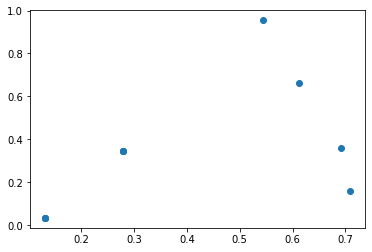

In [38]:
plt.scatter(exampleData[draw][:,0], exampleData[draw][:,1])

## Create datapoints where the error is big
1. Every 50 iterations we take the 10% worse particles and we add them to the dataset to fix that.
2. Is it better than having all the point randomly at first?

In [29]:
import torch
import numpy as np
import scipy.linalg
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt
from verification import LinearQuadraticRegulator, NeuralNet, GenerateSpaceData
from tqdm import tqdm
from verification import _hjbEquation
from utils import vect

In [49]:
interiorPointCount = 1000
dataPointCount = 1
iterations = [1000]
lrs = [1e-1]
layers = [2, 10, 1]
gamma = np.array([0.1, 1., 1.])

In [50]:
parameters = {
    'iterationData': 25,
    'additionalDataCount': 1,
    'maxIterationData': 500
}

network = NeuralNet(layers=layers, lrs=lrs, special=False, addData=True, **parameters)
lqr = LinearQuadraticRegulator(network=network, gamma=gamma)

In [51]:
info = lqr.train(interiorPointCount, dataPointCount, iterations)

0 / 1000 (0 / 1000), lr:1.0e-01, loss:3.70e-01
10 / 1000 (10 / 1000), lr:1.0e-01, loss:3.32e-02
20 / 1000 (20 / 1000), lr:1.0e-01, loss:1.70e-02
tensor([[0.0976, 0.4304],
        [0.9965, 0.9370]], grad_fn=<CatBackward>)
torch.Size([2, 2])
30 / 1000 (30 / 1000), lr:1.0e-01, loss:1.47e-01
40 / 1000 (40 / 1000), lr:1.0e-01, loss:1.03e-01
tensor([[0.0976, 0.4304],
        [0.9965, 0.9370],
        [0.9965, 0.9370]], grad_fn=<CatBackward>)
torch.Size([3, 2])
50 / 1000 (50 / 1000), lr:1.0e-01, loss:8.19e-02
60 / 1000 (60 / 1000), lr:1.0e-01, loss:4.99e-02
70 / 1000 (70 / 1000), lr:1.0e-01, loss:1.63e-02
tensor([[ 0.0976,  0.4304],
        [ 0.9965,  0.9370],
        [ 0.9965,  0.9370],
        [-0.9405,  0.9924]], grad_fn=<CatBackward>)
torch.Size([4, 2])
80 / 1000 (80 / 1000), lr:1.0e-01, loss:8.18e-02
90 / 1000 (90 / 1000), lr:1.0e-01, loss:5.93e-02
tensor([[ 0.0976,  0.4304],
        [ 0.9965,  0.9370],
        [ 0.9965,  0.9370],
        [-0.9405,  0.9924],
        [-0.9405,  0.9924]], 

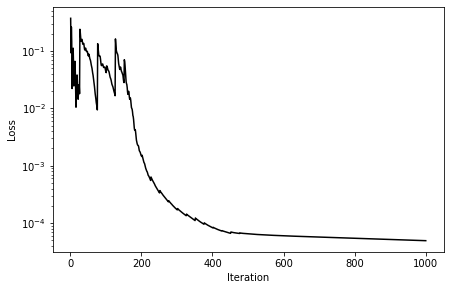

In [52]:
fig, ax = plt.subplots(figsize=(7, 4.5))
ax.plot( info['it'], info['loss'], color='black' )
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.set_yscale('log');

In [34]:
######################
#     SAVE LOSS      #
######################

np.savetxt("loss_noAddData.csv", np.hstack([
    np.array([ i for i in info['loss'].index][::5]).reshape(-1, 1),
    np.array([ loss for loss in info['loss']][::5]).reshape(-1, 1),
]), delimiter=",", fmt="%.6f")

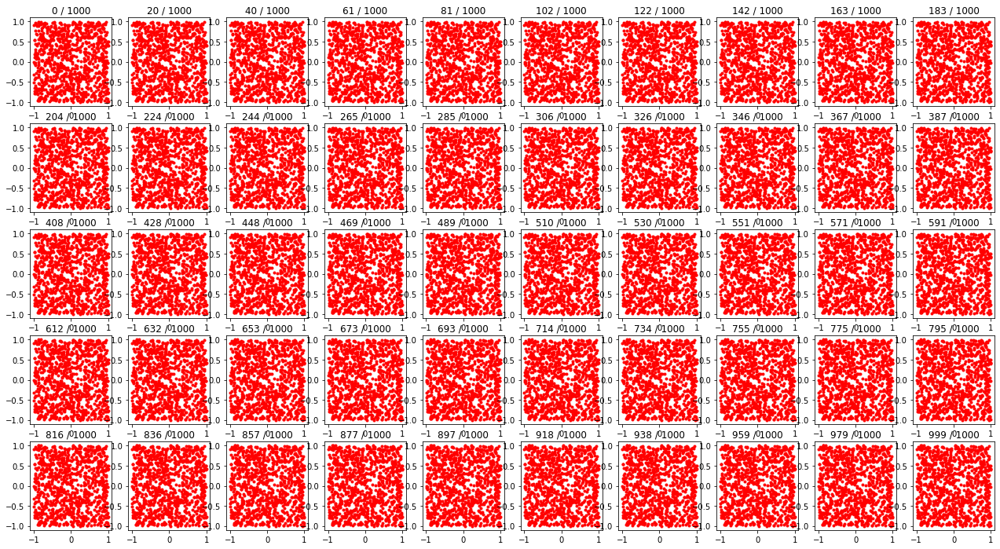

In [8]:
idx_total = sum( iterations )
fig, axs = plt.subplots(5, 10, figsize=(22,12))
axs = axs.flatten()
for ax, ratio in zip(axs[:-1], np.linspace(0, 1, len(axs))[:-1]):
    idx = int(ratio * idx_total)
    ax.scatter( info['xInt'][idx][:,0], info['xInt'][idx][:,1], color='red' , marker='.')
    ax.set_title('%d / %d'%(idx, idx_total))
idx = idx_total - 1
axs[-1].scatter( info['xInt'][idx][:,0], info['xInt'][idx][:,1], color='red' , marker='.')
axs[-1].set_title('%d / %d'%(idx, idx_total));

In [53]:
nPoint = 20
x = np.linspace(-1, 1, nPoint)
y = np.linspace(-1, 1, nPoint)

X, Y = np.meshgrid(x, y)
space = torch.tensor([X, Y]).T.float()

# solution fron the NN
Z = lqr.network.model(space.reshape(-1, 2)).reshape(nPoint,nPoint).detach().numpy()

# hard coded value for P
P = np.array([[0.68989, 0], [0, 0.68989]])

def valueFunction(x):
    return 0.5 * np.dot(x.T, np.dot(P, x)).item()

# true solution
Ztrue = np.array([valueFunction(x.reshape(-1, 1)) for x in space.numpy().reshape(-1, 2)]).reshape(nPoint, nPoint)

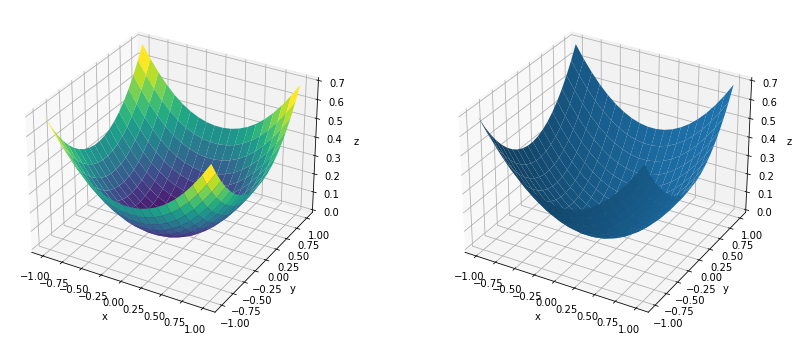

In [54]:
fig = plt.figure(figsize=(22, 6))

ax = fig.add_subplot(1, 3, 2, projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0,0.7)

ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.plot_surface(X, Y, Ztrue)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0,0.7);

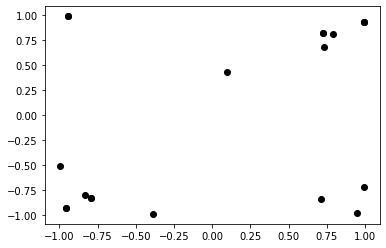

In [55]:
fig, ax = plt.subplots()
ax.scatter(info['xData'].iloc[-1][:,0], info['xData'].iloc[-1][:,1], color='black');

In [38]:
######################
#    SAVE DATASET    #
######################

dataset = info['xData'].iloc[-1]

data_x = []
data_y = []
data_z = []
for i in range(dataset.shape[0]):
    xi, yi = dataset[i]
    zi = valueFunction(dataset[i])
    data_x.append(xi.item())
    data_y.append(yi.item())
    data_z.append(zi)

np.savetxt("dataset_noAddData.csv", np.hstack([np.array(data_x).reshape(-1, 1), np.array(data_y).reshape(-1, 1), np.array(data_z).reshape(-1, 1)]), delimiter=",", fmt="%.6f")

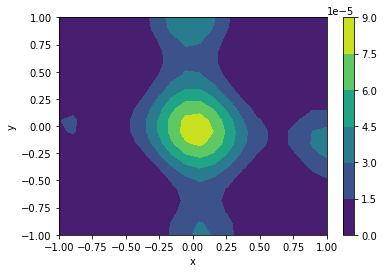

Error (vs true): 1.379e-05


In [56]:
plt.contourf(X, Y, (Z-Ztrue)**2)
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar()
plt.show()
print('Error (vs true): %.3e' %((Z-Ztrue)**2).mean() )

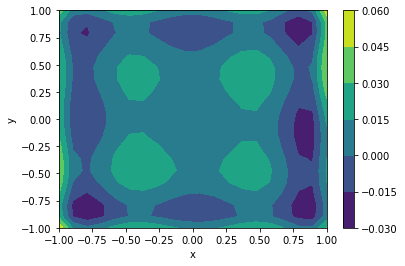

Error (res): 6.477e-03


In [57]:
xSpace = space.reshape(-1, 2)
xSpace.requires_grad = True

lossResidual = _hjbEquation(
    xInt=xSpace,
    yInt=lqr.network.model(xSpace),
    derivativeSpace=lqr.network.partialDerivative(inputTensor=xSpace, x=xSpace, order=1),
    gx=vect(xSpace, lqr.g),
    fx=lqr.f(xSpace),
    lx=lqr.l(xSpace),
    beta=lqr.beta
)

plt.contourf(X, Y, lossResidual.detach().numpy().reshape(nPoint, nPoint))
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar()
plt.show()
print('Error (res): %.3e' %lossResidual.detach().numpy().mean() )

In [41]:
######################
#    SAVE FUNCTION   #
######################
np.savetxt("function_noAddData.csv", np.hstack([
    X.reshape(-1, 1), 
    Y.reshape(-1, 1), 
    Z.reshape(-1, 1), 
    ((Z-Ztrue)**2).reshape(-1, 1),
    lossResidual.detach().numpy().reshape(nPoint, nPoint).reshape(-1, 1),
    Ztrue.reshape(-1, 1)
    ]), delimiter=",", fmt="%.6f")

# Learn on dataset first, then on residual

In [3]:
import torch
import numpy as np
import scipy.linalg
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt
from verification import LinearQuadraticRegulator, NeuralNet, GenerateSpaceData
from tqdm import tqdm
from verification import _hjbEquation
from utils import vect

In [2]:
def stackWeights(network):
    weights = np.array([])
    for layer in network.layers:
        if type(layer) == nn.Linear:
            weights = np.concatenate([
                weights,
                layer.weight.detach().numpy().flatten(),
                layer.bias.detach().numpy().flatten()
            ])
    return weights

In [169]:
interiorPointCount = 1000
dataPointCount = 10
iterations = [1000]
lrs = [2e-1]#[1e-1]
weight_decays = [0]#[1e-4]
#layers = [2, 1]
layers = [2, 10, 1]
# [residual, data, gradient]
#gamma = np.array([0.1, 1., 1.])
gamma = np.array([0, 1., 1.])

In [170]:
network = NeuralNet(layers=layers, lrs=lrs, weight_decays=weight_decays, special=False)
lqr = LinearQuadraticRegulator(network=network, gamma=gamma)

original_weights = stackWeights(lqr.network)

In [171]:
nPoint = 20
x = np.linspace(-1, 1, nPoint)
y = np.linspace(-1, 1, nPoint)

X, Y = np.meshgrid(x, y)
space = torch.tensor([X, Y]).T.float()

# solution fron the NN
Zoriginal = lqr.network.model(space.reshape(-1, 2)).reshape(nPoint,nPoint).detach().numpy()

In [172]:
info = lqr.train(interiorPointCount, dataPointCount, iterations)

0 / 1000 (0 / 1000), lr:2.0e-01, loss:8.25e-01
10 / 1000 (10 / 1000), lr:2.0e-01, loss:2.81e-01
20 / 1000 (20 / 1000), lr:2.0e-01, loss:1.22e-01
30 / 1000 (30 / 1000), lr:2.0e-01, loss:4.59e-02
40 / 1000 (40 / 1000), lr:2.0e-01, loss:4.68e-02
50 / 1000 (50 / 1000), lr:2.0e-01, loss:3.61e-02
60 / 1000 (60 / 1000), lr:2.0e-01, loss:2.72e-02
70 / 1000 (70 / 1000), lr:2.0e-01, loss:1.83e-02
80 / 1000 (80 / 1000), lr:2.0e-01, loss:9.40e-03
90 / 1000 (90 / 1000), lr:2.0e-01, loss:6.65e-03
100 / 1000 (100 / 1000), lr:2.0e-01, loss:4.41e-03
110 / 1000 (110 / 1000), lr:2.0e-01, loss:3.40e-03
120 / 1000 (120 / 1000), lr:2.0e-01, loss:2.69e-03
130 / 1000 (130 / 1000), lr:2.0e-01, loss:2.26e-03
140 / 1000 (140 / 1000), lr:2.0e-01, loss:1.90e-03
150 / 1000 (150 / 1000), lr:2.0e-01, loss:1.64e-03
160 / 1000 (160 / 1000), lr:2.0e-01, loss:1.43e-03
170 / 1000 (170 / 1000), lr:2.0e-01, loss:1.26e-03
180 / 1000 (180 / 1000), lr:2.0e-01, loss:1.13e-03
190 / 1000 (190 / 1000), lr:2.0e-01, loss:1.03e-03
20

In [173]:
optimal_weights = stackWeights(lqr.network)
weights = pd.DataFrame()
weights['original'] = original_weights
weights['optimal'] = optimal_weights

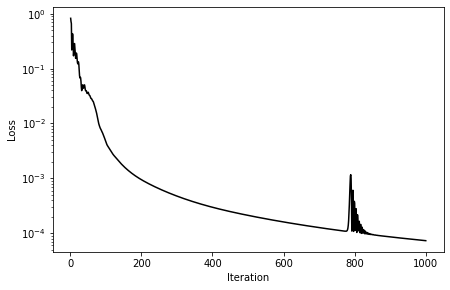

In [174]:
fig, ax = plt.subplots(figsize=(7, 4.5))
ax.plot( info['it'], info['loss'], color='black' )
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.set_yscale('log');

In [139]:
nPoint = 20
x = np.linspace(-1, 1, nPoint)
y = np.linspace(-1, 1, nPoint)

X, Y = np.meshgrid(x, y)
space = torch.tensor([X, Y]).T.float()

# solution fron the NN
Zdataset = lqr.network.model(space.reshape(-1, 2)).reshape(nPoint,nPoint).detach().numpy()

# hard coded value for P
P = np.array([[0.68989, 0], [0, 0.68989]])

def valueFunction(x):
    return 0.5 * np.dot(x.T, np.dot(P, x)).item()

# true solution
Ztrue = np.array([valueFunction(x.reshape(-1, 1)) for x in space.numpy().reshape(-1, 2)]).reshape(nPoint, nPoint)

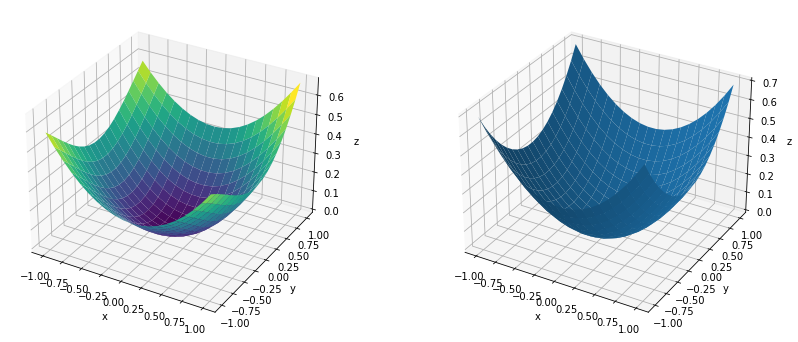

In [141]:
fig = plt.figure(figsize=(22, 6))

ax = fig.add_subplot(1, 3, 2, projection='3d')
ax.plot_surface(X, Y, Zdataset, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
#ax.set_zlim(0,0.7)

ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.plot_surface(X, Y, Ztrue)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0,0.7);

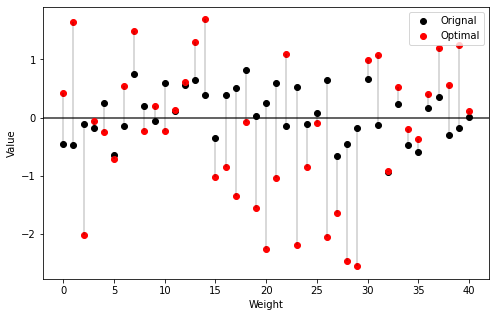

In [117]:
fig, ax = plt.subplots(figsize=(8,5))
ax.scatter(weights.index, weights['original'], color='black', label='Orignal')
ax.scatter(weights.index, weights['optimal'], color='red', label='Optimal')
for index, row in weights.iterrows():
    ax.vlines(index, min(row['original'], row['optimal']), max(row['original'], row['optimal']), color='black', alpha=0.2)
ax.axhline(y=0, zorder=0, color='black', alpha=0.8)
ax.set_xlabel('Weight')
ax.set_ylabel('Value')
ax.legend();

In [118]:
# save the weights
torch.save(lqr.network.state_dict(), 'weights.pt')

In [175]:
######################
#     SAVE LOSS      #
######################

np.savetxt("loss_dataset.csv", np.hstack([
    np.array([ i for i in info['loss'].index][::5]).reshape(-1, 1),
    np.array([ loss for loss in info['loss']][::5]).reshape(-1, 1),
]), delimiter=",", fmt="%.6f")

In [144]:
######################
#    SAVE DATASET    #
######################

dataSampler = GenerateSpaceData([(-1, 1), (-1, 1)])
dataset = np.array( dataSampler.sampleDataX(dataPointCount) )[:, :, 0].T

data_x = []
data_y = []
data_z = []
for i in range(dataPointCount):
    xi, yi = dataset[i]
    zi = valueFunction(dataset[i])
    data_x.append(xi.item())
    data_y.append(yi.item())
    data_z.append(zi)

np.savetxt("dataset_training.csv", np.hstack([np.array(data_x).reshape(-1, 1), np.array(data_y).reshape(-1, 1), np.array(data_z).reshape(-1, 1)]), delimiter=",", fmt="%.6f")

In [180]:
interiorPointCount = 1000
dataPointCount = 20
iterations = [1000]
lrs = [2e-2]
weight_decays = [0]
#layers = [2, 1]
layers = [2, 10, 1]
# [residual, data, gradient]
#gamma = np.array([0.1, 1., 1.])
gamma = np.array([1., 0., 0.])

In [181]:
network = NeuralNet(layers=layers, lrs=lrs, weight_decays=weight_decays, special=False)
lqr = LinearQuadraticRegulator(network=network, gamma=gamma)

# load weights
lqr.network.load_state_dict(torch.load('weights.pt'))

<All keys matched successfully>

In [182]:
info = lqr.train(interiorPointCount, dataPointCount, iterations)

0 / 1000 (0 / 1000), lr:2.0e-02, loss:5.19e-02
10 / 1000 (10 / 1000), lr:2.0e-02, loss:2.41e-02
20 / 1000 (20 / 1000), lr:2.0e-02, loss:1.41e-02
30 / 1000 (30 / 1000), lr:2.0e-02, loss:8.39e-03
40 / 1000 (40 / 1000), lr:2.0e-02, loss:5.95e-03
50 / 1000 (50 / 1000), lr:2.0e-02, loss:4.50e-03
60 / 1000 (60 / 1000), lr:2.0e-02, loss:3.49e-03
70 / 1000 (70 / 1000), lr:2.0e-02, loss:2.65e-03
80 / 1000 (80 / 1000), lr:2.0e-02, loss:1.97e-03
90 / 1000 (90 / 1000), lr:2.0e-02, loss:1.43e-03
100 / 1000 (100 / 1000), lr:2.0e-02, loss:1.03e-03
110 / 1000 (110 / 1000), lr:2.0e-02, loss:7.58e-04
120 / 1000 (120 / 1000), lr:2.0e-02, loss:5.74e-04
130 / 1000 (130 / 1000), lr:2.0e-02, loss:4.46e-04
140 / 1000 (140 / 1000), lr:2.0e-02, loss:3.56e-04
150 / 1000 (150 / 1000), lr:2.0e-02, loss:2.89e-04
160 / 1000 (160 / 1000), lr:2.0e-02, loss:2.39e-04
170 / 1000 (170 / 1000), lr:2.0e-02, loss:2.01e-04
180 / 1000 (180 / 1000), lr:2.0e-02, loss:1.72e-04
190 / 1000 (190 / 1000), lr:2.0e-02, loss:1.48e-04
20

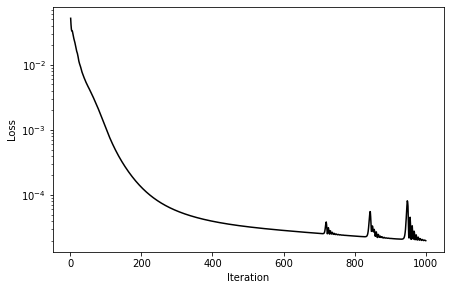

In [183]:
fig, ax = plt.subplots(figsize=(7, 4.5))
ax.plot( info['it'], info['loss'], color='black' )
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.set_yscale('log');

In [184]:
# solution fron the NN
Zresidual = lqr.network.model(space.reshape(-1, 2)).reshape(nPoint,nPoint).detach().numpy()

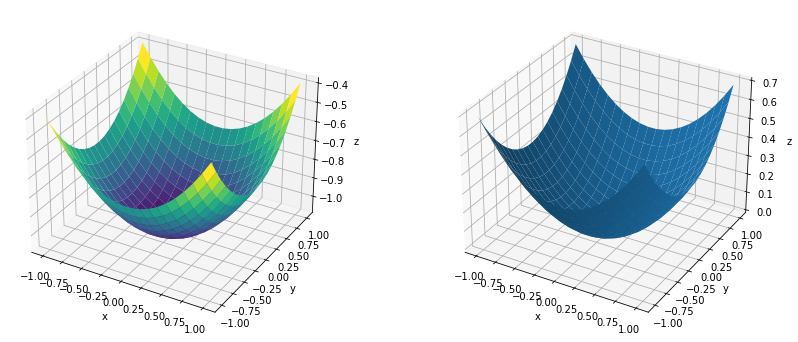

In [185]:
fig = plt.figure(figsize=(22, 6))

ax = fig.add_subplot(1, 3, 2, projection='3d')
ax.plot_surface(X, Y, Zresidual, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
#ax.set_zlim(0,0.7)

ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.plot_surface(X, Y, Ztrue)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0,0.7);

In [186]:
residual_weights = stackWeights(lqr.network)
weights['residual'] = residual_weights

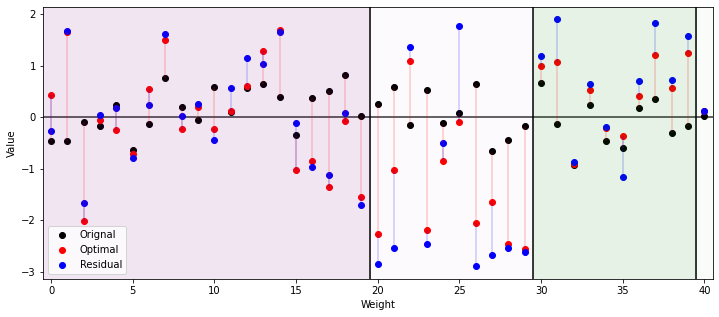

In [187]:
fig, ax = plt.subplots(figsize=(12,5))
ax.scatter(weights.index, weights['original'], color='black', label='Orignal')
ax.scatter(weights.index, weights['optimal'], color='red', label='Optimal')
ax.scatter(weights.index, weights['residual'], color='blue', label='Residual')
for index, row in weights.iterrows():
    ax.vlines(index, min(row['original'], row['optimal']), max(row['original'], row['optimal']), color='red', alpha=0.2)
    ax.vlines(index, min(row['optimal'], row['residual']), max(row['optimal'], row['residual']), color='blue', alpha=0.2)
ax.axhline(y=0, zorder=0, color='black', alpha=0.8)
ax.set_xlabel('Weight')
ax.set_ylabel('Value')
ax.axvspan(-0.5, 19.5, alpha=0.1, color='purple')
ax.axvspan(19.5, 29.5, alpha=0.02, color='purple')
ax.axvspan(29.5, 39.5, alpha=0.1, color='green')
ax.axvspan(39.5, 40.5, alpha=0.02, color='green')
ax.axvline(x = 19.5, color='black')
ax.axvline(x = 29.5, color='black')
ax.axvline(x = 39.5, color='black')
ax.set_xlim(-0.5, 40.5)
ax.legend();

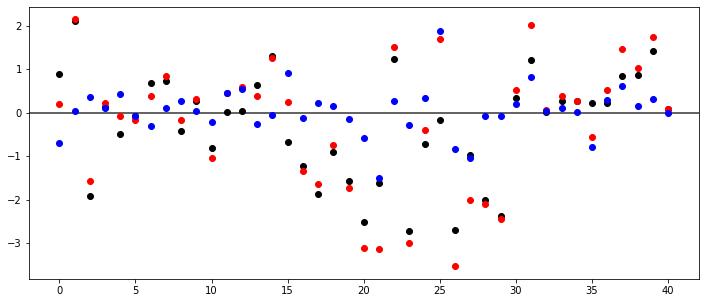

In [194]:
fig, ax = plt.subplots(figsize=(12,5))
ax.scatter(weights.index, weights['optimal'] - weights['original'], color='black', label='Orignal')
ax.scatter(weights.index, weights['residual'] - weights['original'], color='red', label='Orignal')
ax.scatter(weights.index, weights['residual'] - weights['optimal'], color='blue', label='Orignal')
ax.axhline(y=0, zorder=0, color='black', alpha=0.8)

In [188]:
print( 'Distance original - optimal weights: %.2f' %np.mean(np.square(weights['original'] - weights['optimal'])) )
print( 'Distance original - residual weights: %.2f' %np.mean(np.square(weights['original'] - weights['residual'])) )
print( 'Distance optimal - residual weights: %.2f' %np.mean(np.square(weights['optimal'] - weights['residual'])) )

Distance original - optimal weights: 1.55
Distance original - residual weights: 2.24
Distance optimal - residual weights: 0.31


In [160]:
######################
#    SAVE FUNCTION   #
######################
np.savetxt("function_all.csv", np.hstack([X.reshape(-1, 1), Y.reshape(-1, 1), Zoriginal.reshape(-1, 1), Zdataset.reshape(-1, 1), Zresidual.reshape(-1, 1), Ztrue.reshape(-1, 1)]), delimiter=",", fmt="%.6f")

In [162]:
######################
#     SAVE LOSS      #
######################

np.savetxt("loss_residual.csv", np.hstack([
    np.array([ i for i in info['loss'].index][::5]).reshape(-1, 1),
    np.array([ loss for loss in info['loss']][::5]).reshape(-1, 1),
]), delimiter=",", fmt="%.6f")

In [159]:
######################
#    SAVE WEIGHTS    #
######################
np.savetxt("weights_all.csv", np.hstack([
    weights['original'].to_numpy().reshape(-1, 1),
    weights['optimal'].to_numpy().reshape(-1, 1),
    weights['residual'].to_numpy().reshape(-1, 1)
    ]), delimiter=",", fmt="%.6f")

# Adjust the weights dynamically

In [1]:
# what about creating a bernoulli RV, with a mean driven by a Beta law where the number of successes and fails is based on the 
# or we just put a sigmoid on the weights, and multiply the weight by a coefficient every time the ratio of the two parts evolves 
# eg: lambda=0.3 (and 1-lambda=0.7). And loss = lambda*lResidual + (1-lambda)*lData
# r_t = lResidual_t / lData_t, if rt > r_{t-1}, then x += 1 and lambda = sigmoid(x)
from scipy.special import expit

def computeLambda(x, lossRes, lossData, rPrev):
    rCurrent = lossRes / lossData
    if rCurrent > rPrev:
        x += 0.1
    else:
        x-= 0.1
    return x, expit(x)

In [2]:
computeLambda(-0.4, 2, 3, 1)

(-0.5, 0.3775406687981454)

In [3]:
import torch
import numpy as np
import scipy.linalg
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt
from verification import LinearQuadraticRegulator, NeuralNet, GenerateSpaceData
from tqdm import tqdm
from verification import _hjbEquation
from utils import vect

In [4]:
interiorPointCount = 1000
dataPointCount = 20
iterations = [2000, 3000]
lrs = [2e-1, 5e-2]#[1e-1]
weight_decays = [0, 0]#[1e-4]
#layers = [2, 1]
layers = [2, 10, 1]
# [residual, data, gradient]
#gamma = np.array([0.1, 1., 1.])
gamma = np.array([0, 1., 1.])
deltaCoeff = 0.1
ponderationIni = 0.1

In [5]:
network = NeuralNet(layers=layers, lrs=lrs, weight_decays=weight_decays, special=False)
lqr = LinearQuadraticRegulator(network=network, gamma=gamma, **{'deltaCoeff': deltaCoeff, 'ponderationIni': ponderationIni})

In [6]:
info = lqr.train(interiorPointCount, dataPointCount, iterations)

0 / 5000 (0 / 2000), lr:2.0e-01, loss:8.13e-01
100 / 5000 (100 / 2000), lr:2.0e-01, loss:1.07e-02
200 / 5000 (200 / 2000), lr:2.0e-01, loss:3.18e-04
300 / 5000 (300 / 2000), lr:2.0e-01, loss:9.44e-05
400 / 5000 (400 / 2000), lr:2.0e-01, loss:4.59e-05
500 / 5000 (500 / 2000), lr:2.0e-01, loss:3.00e-05
600 / 5000 (600 / 2000), lr:2.0e-01, loss:2.49e-05
700 / 5000 (700 / 2000), lr:2.0e-01, loss:2.33e-05
800 / 5000 (800 / 2000), lr:2.0e-01, loss:2.07e-05
900 / 5000 (900 / 2000), lr:2.0e-01, loss:1.85e-05
1000 / 5000 (1000 / 2000), lr:2.0e-01, loss:1.77e-05
1100 / 5000 (1100 / 2000), lr:2.0e-01, loss:1.69e-05
1200 / 5000 (1200 / 2000), lr:2.0e-01, loss:1.75e-05
1300 / 5000 (1300 / 2000), lr:2.0e-01, loss:1.45e-05
1400 / 5000 (1400 / 2000), lr:2.0e-01, loss:1.59e-05
1500 / 5000 (1500 / 2000), lr:2.0e-01, loss:1.53e-05
1600 / 5000 (1600 / 2000), lr:2.0e-01, loss:2.07e-05
1700 / 5000 (1700 / 2000), lr:2.0e-01, loss:1.46e-05
1800 / 5000 (1800 / 2000), lr:2.0e-01, loss:1.97e-05
1900 / 5000 (1900

In [7]:
nPoint = 20
x = np.linspace(-1, 1, nPoint)
y = np.linspace(-1, 1, nPoint)

X, Y = np.meshgrid(x, y)
space = torch.tensor([X, Y]).T.float()

# solution fron the NN
Zdataset = lqr.network.model(space.reshape(-1, 2)).reshape(nPoint,nPoint).detach().numpy()

# hard coded value for P
P = np.array([[0.68989, 0], [0, 0.68989]])

def valueFunction(x):
    return 0.5 * np.dot(x.T, np.dot(P, x)).item()

# true solution
Ztrue = np.array([valueFunction(x.reshape(-1, 1)) for x in space.numpy().reshape(-1, 2)]).reshape(nPoint, nPoint)

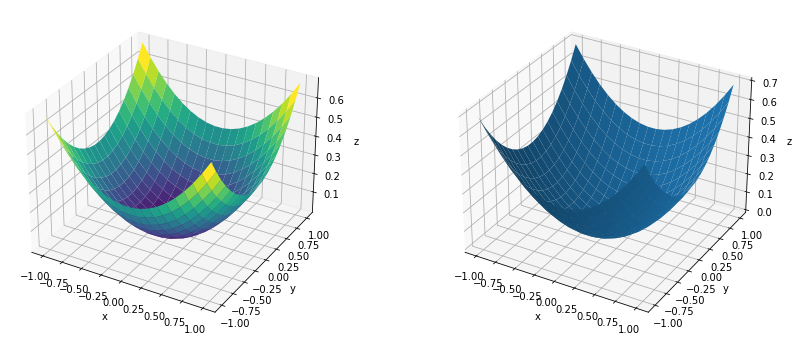

In [8]:
fig = plt.figure(figsize=(22, 6))

ax = fig.add_subplot(1, 3, 2, projection='3d')
ax.plot_surface(X, Y, Zdataset, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
#ax.set_zlim(0,0.7)

ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.plot_surface(X, Y, Ztrue)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0,0.7);

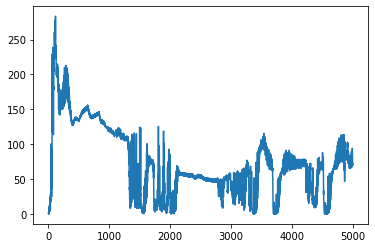

In [9]:
plt.plot(lqr.ratioList)

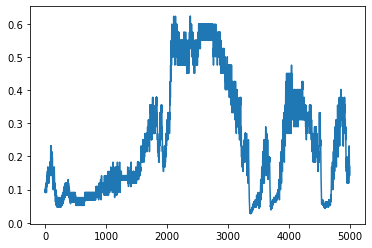

In [10]:
plt.plot([expit(x) for x in lqr.coeffList])

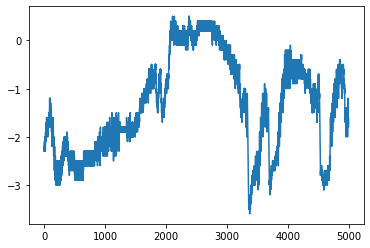

In [11]:
plt.plot(lqr.coeffList)

# Use the dataset to compute the ratio residual / data term

In [1]:
import torch
import numpy as np
import scipy.linalg
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt
from verification import LinearQuadraticRegulator, NeuralNet, GenerateSpaceData
from tqdm import tqdm
from verification import _hjbEquation
from utils import vect
from scipy.special import expit

In [85]:
interiorPointCount = 1000
dataPointCount = 20
iterations = [5000]
lrs = [1e-1]#[1e-1]
weight_decays = [0]#[1e-4]
#layers = [2, 1]
layers = [2, 10, 1]
# [residual, data, gradient]
#gamma = np.array([0.1, 1., 1.])
gamma = np.array([0, 1., 1.])
deltaCoeff = 0.05
ponderationIni = 0.5

In [86]:
network = NeuralNet(layers=layers, lrs=lrs, weight_decays=weight_decays, special=False)
lqr = LinearQuadraticRegulator(network=network, gamma=gamma, **{'deltaCoeff': deltaCoeff, 'ponderationIni': ponderationIni})

In [90]:
info = lqr.train(interiorPointCount, dataPointCount, iterations)

0 / 5000 (0 / 5000), lr:1.0e-01, loss:1.77e-04
100 / 5000 (100 / 5000), lr:1.0e-01, loss:3.35e-04
200 / 5000 (200 / 5000), lr:1.0e-01, loss:3.07e-04
300 / 5000 (300 / 5000), lr:1.0e-01, loss:3.59e-04
400 / 5000 (400 / 5000), lr:1.0e-01, loss:2.25e-04
500 / 5000 (500 / 5000), lr:1.0e-01, loss:2.06e-04
600 / 5000 (600 / 5000), lr:1.0e-01, loss:1.37e-04
700 / 5000 (700 / 5000), lr:1.0e-01, loss:1.59e-04
800 / 5000 (800 / 5000), lr:1.0e-01, loss:1.46e-04
900 / 5000 (900 / 5000), lr:1.0e-01, loss:1.85e-04
1000 / 5000 (1000 / 5000), lr:1.0e-01, loss:1.84e-04
1100 / 5000 (1100 / 5000), lr:1.0e-01, loss:1.98e-04
1200 / 5000 (1200 / 5000), lr:1.0e-01, loss:1.81e-04
1300 / 5000 (1300 / 5000), lr:1.0e-01, loss:2.13e-04
1400 / 5000 (1400 / 5000), lr:1.0e-01, loss:2.11e-04
1500 / 5000 (1500 / 5000), lr:1.0e-01, loss:2.09e-04
1600 / 5000 (1600 / 5000), lr:1.0e-01, loss:2.06e-04
1700 / 5000 (1700 / 5000), lr:1.0e-01, loss:2.04e-04
1800 / 5000 (1800 / 5000), lr:1.0e-01, loss:2.19e-04
1900 / 5000 (1900

In [88]:
nPoint = 20
x = np.linspace(-1, 1, nPoint)
y = np.linspace(-1, 1, nPoint)

X, Y = np.meshgrid(x, y)
space = torch.tensor([X, Y]).T.float()

# solution fron the NN
Zdataset = lqr.network.model(space.reshape(-1, 2)).reshape(nPoint,nPoint).detach().numpy()

# hard coded value for P
P = np.array([[0.68989, 0], [0, 0.68989]])

def valueFunction(x):
    return 0.5 * np.dot(x.T, np.dot(P, x)).item()

# true solution
Ztrue = np.array([valueFunction(x.reshape(-1, 1)) for x in space.numpy().reshape(-1, 2)]).reshape(nPoint, nPoint)

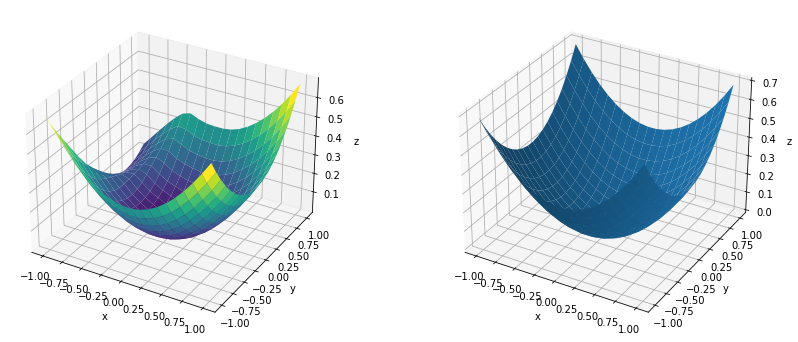

In [89]:
fig = plt.figure(figsize=(22, 6))

ax = fig.add_subplot(1, 3, 2, projection='3d')
ax.plot_surface(X, Y, Zdataset, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
#ax.set_zlim(0,0.7)

ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.plot_surface(X, Y, Ztrue)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0,0.7);

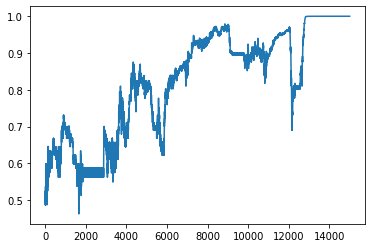

In [83]:
plt.plot( lqr.ponderationList )

In [4]:
xlist = np.linspace(-2, 2, 100)

def sol(x):
    return 0.5 * np.sqrt(1 + 2*x**2 + 2*np.sqrt(x**4 +1))

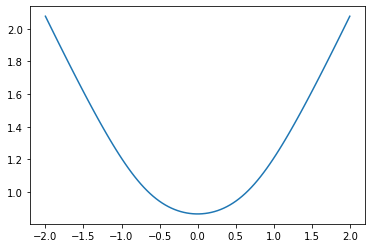

In [7]:
plt.plot(xlist, sol(xlist))

# Non linear case

In [1]:
import torch
import numpy as np
import scipy.linalg
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt
from verification import LinearQuadraticRegulator, NeuralNet, GenerateSpaceData, NonLinear
from tqdm import tqdm
from verification import _hjbEquation
from utils import vect
from scipy.special import expit

In [7]:
interiorPointCount = 1000
dataPointCount = 20
iterations = [1000, 1000]
lrs = [1e-1, 5e-2]
weight_decays = [0, 0, ]
layers = [2, 10, 1]
gamma = {'residual':0., 'data':1., 'gradient':1.}
deltaCoeff = 0.05
ponderationIni = 0.5

In [8]:
network = NeuralNet(layers=layers, lrs=lrs, weight_decays=weight_decays, special=False)
nonLinear = NonLinear(network=network, gamma=gamma)

In [9]:
info = nonLinear.train(interiorPointCount, dataPointCount, iterations)

0 / 2000 (0 / 1000), lr:1.0e-01, loss:1.10e+01
100 / 2000 (100 / 1000), lr:1.0e-01, loss:5.14e-02
200 / 2000 (200 / 1000), lr:1.0e-01, loss:1.30e-02
300 / 2000 (300 / 1000), lr:1.0e-01, loss:6.11e-03
400 / 2000 (400 / 1000), lr:1.0e-01, loss:4.20e-03
500 / 2000 (500 / 1000), lr:1.0e-01, loss:3.33e-03
600 / 2000 (600 / 1000), lr:1.0e-01, loss:2.80e-03
700 / 2000 (700 / 1000), lr:1.0e-01, loss:2.45e-03
800 / 2000 (800 / 1000), lr:1.0e-01, loss:2.20e-03
900 / 2000 (900 / 1000), lr:1.0e-01, loss:2.03e-03
1000 / 2000 (0 / 1000), lr:5.0e-02, loss:1.86e-03
1100 / 2000 (100 / 1000), lr:5.0e-02, loss:1.54e-03
1200 / 2000 (200 / 1000), lr:5.0e-02, loss:1.10e-03
1300 / 2000 (300 / 1000), lr:5.0e-02, loss:7.69e-04
1400 / 2000 (400 / 1000), lr:5.0e-02, loss:5.74e-04
1500 / 2000 (500 / 1000), lr:5.0e-02, loss:4.71e-04
1600 / 2000 (600 / 1000), lr:5.0e-02, loss:5.57e-04
1700 / 2000 (700 / 1000), lr:5.0e-02, loss:3.77e-04
1800 / 2000 (800 / 1000), lr:5.0e-02, loss:3.46e-04
1900 / 2000 (900 / 1000), lr

In [54]:
torch.save(nonLinear.network.state_dict(), 'weights_data.pt')

In [36]:
interiorPointCount = 200
dataPointCount = 20
iterations = [1000, 1000]
lrs = [1e-1, 5e-2]
weight_decays = [0, 0, ]
layers = [2, 50, 50, 1]
gamma = {'residual':1., 'data':0., 'gradient':0.}
deltaCoeff = 0.05
ponderationIni = 0.5

network = NeuralNet(layers=layers, lrs=lrs, weight_decays=weight_decays, special=False, trainingMethod='newton')
nonLinear = NonLinear(network=network, gamma=gamma)

#nonLinear.network.load_state_dict(torch.load('weights_data.pt'))

In [37]:
info = nonLinear.train(interiorPointCount, dataPointCount, iterations)

In [38]:
len( network.lossEvolution )

7043

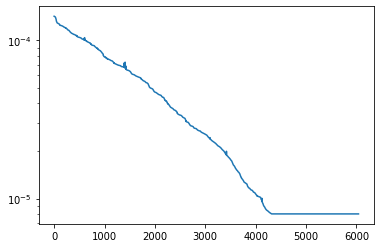

In [39]:
plt.plot(network.lossEvolution[1000:])
plt.yscale('log')

In [40]:
nPoint = 40
x = np.linspace(-1, 1, nPoint)
y = np.linspace(-1, 1, nPoint)

X, Y = np.meshgrid(x, y)
space = torch.tensor([X, Y]).T.float()

# solution fron the NN
Z = nonLinear.network.model(space.reshape(-1, 2)).reshape(nPoint,nPoint).detach().numpy()

# hard coded value for P
coeff_a = lambda x: np.sqrt(x**4 + 1) * np.sqrt(  2*x**2 + 2*np.sqrt(x**4 + 1) + 1. ) 
coeff_b = lambda x: x**2 + np.sqrt(x**4 + 1)
coeff_c = lambda x: x**2 + np.sqrt(x**4 + 1)
coeff_d = lambda x: np.sqrt( 2*x**2 + 2*np.sqrt(x**4 + 1) + 1. ) 

def valueFunction(x):
    x1 = x[0].item()
    P = np.array([[coeff_a(x1), coeff_b(x1)], [coeff_c(x1), coeff_d(x1)]])

    return 0.5 * np.dot(x.T, np.dot(P, x)).item()

# true solution
Ztrue = np.array([valueFunction(x.reshape(-1, 1)) for x in space.numpy().reshape(-1, 2)]).reshape(nPoint, nPoint)

In [ ]:
xdata = info['xData'][0][:, 0]
ydata = info['xData'][0][:, 1]
zdata = np.array([valueFunction(x) for x in info['xData'][0]])

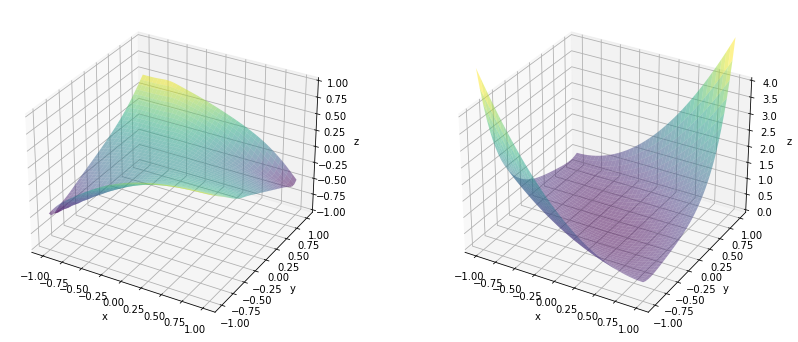

In [43]:
fig = plt.figure(figsize=(22, 6))

ax = fig.add_subplot(1, 3, 2, projection='3d')
ax.plot_surface(X, Y, Z - nonLinear.network.model( torch.tensor([0., 0.]) ).detach().numpy(), cmap='viridis', alpha=0.5)
#ax.view_init(elev=25., azim=-210)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
#ax.scatter(xdata, ydata, zdata, color='black')
ax.set_zlim(-1,1);

ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.plot_surface(X, Y, Ztrue, cmap='viridis', alpha=0.5)
#ax.view_init(elev=25., azim=110)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
#ax.scatter(xdata, ydata, zdata, color='black')
ax.set_zlim(0,4);

In [51]:
xData = info['xData'][0]
yData = nonLinear.network.model( torch.tensor(xData) )
yDataTrue = np.array( [nonLinear.analyticalSolution(x)[0] for x in xData] )
xDataTensor = torch.tensor(xData, requires_grad=True)
gradData = nonLinear.network.partialDerivative(inputTensor=xDataTensor, x=xDataTensor, order=1)
gradDataTrue = np.array( [nonLinear.analyticalSolution(x)[1] for x in xData] )

In [52]:
(yData.flatten().detach().numpy() - yDataTrue).max()

0.12741907981135636

In [55]:
(gradData.detach().numpy() - gradDataTrue).max()

0.06808285791074642

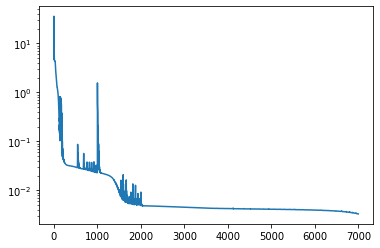

In [58]:
plt.plot(info['loss'])
plt.yscale('log')

## debug

In [40]:
dataSampler = GenerateSpaceData([(-1, 1)] * 2)

xInt = torch.tensor( dataSampler.sampleInteriorX(10), requires_grad=True)[:, :, 0].T.float()

In [175]:
from utils import vect

def matrixA(x):
    x1 = x[0]
    A = torch.tensor([[0, 1], [x1**2, 0]])
    return A

def vectorB(x):
    B = torch.tensor([[0], [1]]).float()
    return B

In [176]:
def f(x):
    ''' (d, 1) -> (d, 1)
    '''
    return torch.matmul(matrixA(x), x.T).T

    # maybe put the vectorial form?? vect(xInt, f)

def g(x):
    ''' (d, 1) -> (d, d)
        Equals to B.
        Use the function vect to vectorise wrt the examples.

        if u is a scalar, we can have g(d, 1) -> (d, 1).

    '''
    return vectorB(x)

def l(x):
    ''' (d, 1) -> (1, 1)
        Equals to 1/2 y^T Q y.
    '''
    return 0.5 * torch.norm(x, dim = 1)**2

In [177]:
def fun_f(x):
    return torch.matmul(matrixA(x), x.T).T

fVect = np.vectorize(fun_f)

In [165]:
def doOperation(x):
    x = (x**2)
    x = np.matmul( np.array([[0, 0], [1, 0]]), x ).reshape(-1, 1)
    x = np.matmul( x, np.array([1, 0]).reshape(1, -1))
    x += np.array([[0, 1], [0, 0]])
    return x

vectFunction = np.vectorize(doOperation)

In [198]:
def vect(x, fun):
    return torch.stack([fun(xi) for xi in x])

def vectBis(x, fun):
    return torch.stack( list( map(fun, x) ) )

In [199]:
vect( xInt, f)

tensor([[-0.5453, -0.0216],
        [-0.0014, -0.0229],
        [-0.4642,  0.0417],
        [-0.4911,  0.3313],
        [-0.9238,  0.9424],
        [ 0.4413, -0.0579],
        [ 0.6070,  0.2520],
        [-0.4560, -0.8241],
        [-0.8502, -0.0026],
        [-0.8601, -0.0216]], grad_fn=<StackBackward>)

In [200]:
vectBis( xInt, f)

tensor([[-0.5453, -0.0216],
        [-0.0014, -0.0229],
        [-0.4642,  0.0417],
        [-0.4911,  0.3313],
        [-0.9238,  0.9424],
        [ 0.4413, -0.0579],
        [ 0.6070,  0.2520],
        [-0.4560, -0.8241],
        [-0.8502, -0.0026],
        [-0.8601, -0.0216]], grad_fn=<StackBackward>)

In [164]:
vectFunction(xInt.detach().numpy())

ValueError: matmul: Input operand 1 does not have enough dimensions (has 0, gufunc core with signature (n?,k),(k,m?)->(n?,m?) requires 1)

In [115]:
fVect(xInt.detach().numpy())

IndexError: invalid index to scalar variable.

In [109]:
xInt

tensor([[-0.2783, -0.5453],
        [-0.2842, -0.0014],
        [ 0.3469, -0.4642],
        [ 0.6920, -0.4911],
        [ 0.9804, -0.9238],
        [-0.3868,  0.4413],
        [ 0.6317,  0.6070],
        [-0.9375, -0.4560],
        [-0.1367, -0.8502],
        [-0.2786, -0.8601]], grad_fn=<CopyBackwards>)

In [110]:
coeff_a = lambda x: (np.sqrt(x**4 + 1)) * np.sqrt(  2*x**2 + 2*np.sqrt(x**4 + 1) + 1. ) 
coeff_b = lambda x: x**2 + np.sqrt(x**4 + 1)
coeff_c = lambda x: x**2 + np.sqrt(x**4 + 1)
coeff_d = lambda x: np.sqrt( 2*x**2 + 2*np.sqrt(x**4 + 1) + 1. ) 


x = xInt[0].detach().numpy()
P = np.array([[coeff_a(x[0]), coeff_b(x[0])], [coeff_c(x[0]), coeff_d(x[0])]])
A = np.array([[0, 1],[x[0]**2, 0]])
B = np.array([[0], [1]])

In [111]:
# Ricatti equation
np.dot(P, A) + np.dot(A.T, P) - np.dot(P, np.dot(B, np.dot(B.T, P))) + np.eye(2)

array([[ 0.00000000e+00, -2.22044605e-16],
       [-2.22044605e-16, -4.44089210e-16]])

In [25]:
# Residual equation
res = 2 * np.dot(P, A) - np.dot(P, np.dot(B, np.dot(B.T, P))) + np.eye(2)
res

array([[ 0.        ,  1.50170525],
       [-1.50170525,  0.        ]])

In [26]:
np.dot(x, np.dot(res, x))

-2.7755575615628914e-17

In [27]:
# fx term
fx_term = 0.5 * np.dot(x, np.dot(P, np.dot(A, x))) + 0.5 * np.dot(x, np.dot(A.T, np.dot(P, x)))
fx_term

0.45882077139395994

In [28]:
# gx term
gx_term = - 1 / (4*0.5) * np.dot(x.T, np.dot(P.T, np.dot(B, np.dot(B.T, np.dot(P, x)))))
gx_term

-0.6073157510345573

In [29]:
# lx term
lx_term = 0.5 * np.dot(x, x)
lx_term

0.14849497377872467

In [30]:
fx_term + gx_term + lx_term

-5.8618726539449995e-09

In [43]:
def analyticalSolution(x):
    x = x.detach()

    p12 = lambda x: x**2 + np.sqrt(x**4 + 1)
    p22 = lambda x: np.sqrt( 1 + 2*p12(x) ) 
    p11 = lambda x: (np.sqrt(x**4 + 1)) * p22(x)

    p12_deriv = lambda x: 2 * x * ( 1 + x**2 / np.sqrt(x**4 + 1) )
    p22_deriv = lambda x: p12_deriv(x) / p22(x)
    p11_deriv = lambda x: 2 * x * ( x**2 / np.sqrt(x**4 + 1) * p22(x) + p12(x) / p22(x) )

    v2_deriv = lambda x, y: p12(x) * x + p22(x) * y
    v1_deriv = lambda x, y: 0.5 * ( p11_deriv(x) * x**2 + 2 * x * p11(x) + 2*p12_deriv(x) * x * y + 2*p12(x) * y + y**2 * p22_deriv(x) )

    x1 = x[0].item()
    x2 = x[1].item()
    P = np.array([[p11(x1), p12(x1)], [p12(x1), p22(x1)]])

    yValueFunction = 0.5 * np.dot(x.T, np.dot(P, x)).item()

    gradValueFunction = np.array([v1_deriv(x1, x2), v2_deriv(x1, x2)])

    return yValueFunction, gradValueFunction

In [44]:
yTrue = torch.tensor([analyticalSolution(x.reshape(-1, 1))[0] for x in xInt]).reshape(-1, 1)
gradTrue = torch.tensor([analyticalSolution(x.reshape(-1, 1))[1] for x in xInt]).reshape(-1, xInt.shape[1]).float()

In [45]:
gradTrue

tensor([[-1.7277, -0.8675],
        [ 3.5445,  1.7403],
        [ 3.5432,  2.0041],
        [-4.3895, -1.9788],
        [ 0.9276,  0.1104],
        [ 0.0083, -0.6002],
        [ 1.8597,  0.7268],
        [ 0.2570,  0.9534],
        [ 0.8192,  0.1626],
        [ 3.2192,  2.2785]])

In [34]:
def _hjbEquation(derivativeSpace, gx, fx, lx, beta):
    ''' Hamiton Jacobi Equation.
    '''

    derivativeTerm = - 1. / (4 * beta) * torch.einsum('ni, nij, nkj, nk -> n',
                                         derivativeSpace, gx, gx, derivativeSpace).reshape(-1, 1)
    fxTerm = torch.einsum('ij, ij -> i', derivativeSpace, fx).reshape(-1, 1)
    lxTerm = lx.reshape(-1, 1)
    
    print('derivative: ', derivativeTerm, '\n fxTerm: ', fxTerm, ' \n lxTerm: ', lxTerm)

    equation = derivativeTerm + fxTerm + lxTerm

    return equation

In [35]:
equation = _hjbEquation(
    derivativeSpace=gradTrue,
    gx=vect(xInt, g),
    fx=vect(xInt, f),
    lx=l(xInt),
    beta=0.5
)

derivative:  tensor([[-0.6073],
        [-0.0919],
        [-0.0387],
        [-0.3390],
        [-0.1277],
        [-0.2460],
        [-0.6695],
        [-0.2910],
        [-1.3783],
        [-2.3219]]) 
 fxTerm:  tensor([[ 0.4588],
        [-0.0959],
        [-0.5788],
        [ 0.1121],
        [ 0.0040],
        [-0.2519],
        [ 0.1269],
        [ 0.0719],
        [ 1.1138],
        [ 1.8553]], grad_fn=<ViewBackward>)  
 lxTerm:  tensor([[0.1485],
        [0.1878],
        [0.6175],
        [0.2269],
        [0.1236],
        [0.4979],
        [0.5426],
        [0.2191],
        [0.2645],
        [0.4665]], grad_fn=<ViewBackward>)


In [1]:
equation

NameError: name 'equation' is not defined

In [32]:
import numpy as np

p12 = lambda x: x**2 + np.sqrt(x**4 + 1)
p22 = lambda x: np.sqrt( 1 + 2*p12(x) ) 
p11 = lambda x: (np.sqrt(x**4 + 1)) * p22(x)

p12_deriv = lambda x: 2 * x * ( 1 + x**2 / np.sqrt(x**4 + 1) )
p22_deriv = lambda x: p12_deriv(x) / p22(x)
p11_deriv = lambda x: 2 * x * ( x**2 / np.sqrt(x**4 + 1) * p22(x) + p12(x) / p22(x) )

v2_deriv = lambda x, y: p12(x) * x + p22(x) * y
v1_deriv = lambda x, y: 0.5 * ( p11_deriv(x) * x**2 + 2 * x * p11(x) + 2*p12_deriv(x) * x * y + 2*p12(x) * y + y**2 * p22_deriv(x) )

In [34]:
print( p11(2) )
print( p12(2) )
print( p22(2) )

print( p11_deriv(-1) )
print( p12_deriv(-1) )
print( p22_deriv(-1) )
print( v2_deriv(-1, 2) )
print( v1_deriv(2, 2) )

17.12266308933866
8.123105625617661
4.1528557946593
-5.414213562373094
-3.414213562373095
-1.4142135623730951
2.414213562373095
133.68819661307666


In [27]:
2.4142135623730950488016887242097*2 - 2.4142135623730950488016887242097

2.414213562373095

In [35]:
0.94881334559172312041794438838479*4 + 23.88424562678031570242641664369*2 + 82.124451977149117638708265578603

133.68819661307666

# True solutions of non linear problem

In [ ]:
# first configuration


In [29]:
# second configuration
def valueFunctionConfiguration(x, config):
    # config 1: negative values in the square root
    # config 2: the good one
    # config 3: negative values in the square root
    # config 4: negative values in the square root
    # config 5: negative values in the square root
    # config 6:

    if config == 2:
        p11 = lambda x: (2*x**2 + 2*(x**4 + 1)**(1/2) + 1)**(3/2)/2 - (x**2 + 1/2)*(2*x**2 + 2*(x**4 + 1)**(1/2) + 1)**(1/2)
        p12 = lambda x: x**2 + (x**4 + 1)**(1/2)
        p21 = lambda x: x**2 + (x**4 + 1)**(1/2)
        p22 = lambda x: (2*x**2 + 2*(x**4 + 1)**(1/2) + 1)**(1/2)

    if config == 6:
        p11 = lambda x: (x**2 + 1/2)*(2*x**2 + 2*(x**4 + 1)**(1/2) + 1)**(1/2) - (2*x**2 + 2*(x**4 + 1)**(1/2) + 1)**(3/2)/2
        p12 = lambda x: x**2 + (x**4 + 1)**(1/2)
        p21 = lambda x: x**2 + (x**4 + 1)**(1/2)
        p22 = lambda x: -(2*x**2 + 2*(x**4 + 1)**(1/2) + 1)**(1/2)

    x1 = x[0].item()
    P = np.array([[p11(x1), p12(x1)], [p21(x1), p22(x1)]])

    yValueFunction = 0.5 * np.dot(x.T, np.dot(P, x)).item()

    return yValueFunction

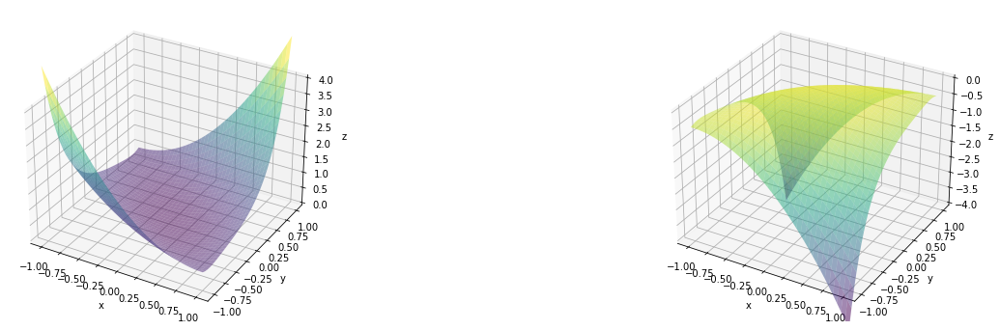

In [31]:
nPoint = 40
x = np.linspace(-1, 1, nPoint)
y = np.linspace(-1, 1, nPoint)

X, Y = np.meshgrid(x, y)
space = torch.tensor([X, Y]).T.float()

# true solution
Ztrue2 = np.array([valueFunctionConfiguration(x.reshape(-1, 1), 2) for x in space.numpy().reshape(-1, 2)]).reshape(nPoint, nPoint)
Ztrue6 = np.array([valueFunctionConfiguration(x.reshape(-1, 1), 6) for x in space.numpy().reshape(-1, 2)]).reshape(nPoint, nPoint)

fig = plt.figure(figsize=(22, 6))

ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.plot_surface(X, Y, Ztrue2, cmap='viridis', alpha=0.5)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(0,4);

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(X, Y, Ztrue6, cmap='viridis', alpha=0.5)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zlim(-4,0);

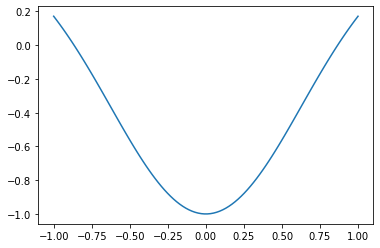

In [23]:
def checkValue(x):
    return 2*x**2 - 2*(x**4 + 1)**(1/2) + 1

xlist = np.linspace(-1, 1, 100)
plt.plot(xlist, checkValue(xlist))

In [17]:
import scipy.stats as stats

In [81]:
nlaunch = 4
nexp = 10000
s = 0
for exp in range(nexp):
    resu = np.zeros(nlaunch)

    for i in range(1, nlaunch):
        side = -1 if i%2==0 else 1
        launch = stats.uniform.rvs()
        resu[i] += resu[i-1] + side * launch
        
    if (resu[1] < 0.5) & (resu[2] > -0.5) & (resu[3] > 0.5):
        s+=1

s/nexp

0.1406

In [ ]:
nlaunch = 4
nexp = 10000
s = 0
for exp in range(nexp):
    s = 0

    for i in range(1, nlaunch):
        side = -1 if i%2==0 else 1
        launch = stats.uniform.rvs()
        s += launch

        if (s > 0.5) or  
        
    if (resu[1] < 0.5) & (resu[2] > -0.5) & (resu[3] > 0.5):
        s+=1

s/nexp

In [113]:
n = 10
df = pd.DataFrame([])
df['launch'] = [0.] + list(stats.uniform.rvs(size=n-1))
df['side'] = [0] + [1, -1] * int(df.shape[0] / 2 - 1) + [1]
df['sided_launch'] = df['side'] * df['launch']
df['score'] = df['sided_launch'].cumsum()

In [114]:
df

,launch,side,sided_launch,score
0,0.000000,0,0.000000,0.000000
1,0.301731,1,0.301731,0.301731
2,0.747915,-1,-0.747915,-0.446183
3,0.862668,1,0.862668,0.416485
4,0.919005,-1,-0.919005,-0.502520
5,0.575135,1,0.575135,0.072615
6,0.857434,-1,-0.857434,-0.784819
7,0.237781,1,0.237781,-0.547038
8,0.869348,-1,-0.869348,-1.416386
9,0.301479,1,0.301479,-1.114907


In [94]:
int(df.shape[0] / 2)

5

In [119]:
stats.uniform.rvs(size=1000).reshape(-1, 100).shape

(10, 100)